# Trabajo Práctico Final

### Fundamentos Matemáticos de la Visión Robótica (67.61)

#### Alumna: Lucía Belén Nápoli
#### Padrón: 101562
#### Cursada: 1er Cuatrimestre 2021

---

## Objetivos
+ Programar un software que permita determinar la *pose* de las piezas dispuestas en la zona de trabajo de manera que el robot pueda tomarlas.

Se deberán completar los siguientes pasos:

1) Calibración de los parámetros intrínsecos de la cámara.

2) Asignación de una terna a la zona de trabajo (Xw; Yw; Zw): realización de la calibración extrínseca.

3) Algoritmo de búsqueda de bloques. Se debe indicar el centro de la pieza en unidades de mm y la orientación de la misma respecto de la terna de trabajo (Xw; Yw; Zw). 

4) Proponer un método de validación del algoritmo (solo la propuesta).

5) Algoritmo de medición de bloques. Determinar la medida de los bloques en cada imagen estimando además la incertidumbre (Ayuda: los bloques son idénticos y su medida real es 65mm x 130mm).

---


Importamos las librerías necesarias

In [1]:
%matplotlib inline
#%matplotlib

import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

import time

import glob

# 1) Calibración de los parámetros intrínsecos

Se cuenta con dos sets de fotos donde tenemos varias imagenes de un patrón plano de un tablero de ajedrez con cuadrados 28mm de lado, tomados desde distintos puntos de vista.

In [2]:
set1_fotos = glob.glob('./img_cal_set1/*')

print("Set1: Hay {} fotos del tablero".format(len(set1_fotos)))

set2_fotos = glob.glob('./img_cal_set2/*')

print("Set2: Hay {} fotos del tablero".format(len(set2_fotos)))

Set1: Hay 20 fotos del tablero
Set2: Hay 10 fotos del tablero


Con estos sets podremos realizar la calibración por  método de Zhang utilizando la función `calibrateCamera` de OpenCV.

El método de Zhang usa el modelo de cámara “pinhole” para relacionar las coordenadas 3D del mundo real con las de la imagen 2D en el plano de la cámara.

\begin{equation}
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} = K
\begin{bmatrix}
R & t 
\end{bmatrix}
\begin{bmatrix}
x_w\\
y_w\\
z_w\\
1
\end{bmatrix}
\end{equation}

El vector $\begin{bmatrix}
u\\
v\\
1
\end{bmatrix}$ es el punto imagen en pixeles.

La matriz de la cámara es: $
K = \begin{bmatrix}
f_x & 0 & t_x \\ 0 & f_y & t_y \\ 0 & 0 & 1
\end{bmatrix}
$ la cual contiene los parámetros intrínsecos, aquellos que son propios del conjunto cámara-lente.

$f_x$ y $f_y$ son las distancias focales en x e y. 

$c_x$ y $c_y$ posiciones del centro del sensor en x e y con respecto al eje óptico.

La matriz $\begin{bmatrix}
R & t 
\end{bmatrix}$ de 3x4 agrupa aquellos parámetros que determinan la posición y orientación de la cámara, es decir, los parámetros extrínsecos.

La matriz de rotación es: $
R = \begin{bmatrix}
r_{11} & r_{12} & r_{13} \\ r_{21} & r_{22} & r_{23} \\ r_{31} & r_{32} & r_{33}
\end{bmatrix}
$  y el vector traslación es $t = \begin{bmatrix}
t_1\\
t_2\\
t_3
\end{bmatrix}$

El vector $\begin{bmatrix}
x_w\\
y_w\\
z_w\\
1
\end{bmatrix}$ es el punto objeto que vamos a querer obtener luego.

## 1.1 Identificación de esquinas

Armo una lista de los puntos que vamos a reconocer en el mundo que corresponden a las coordenadas en el tablero de ajedrez.

Los multiplico por 28 que es la medida en mm de los lados de los cuadrados del tablero

In [3]:
# Tamaño del tablero
ch_size = (8, 6)

objp = np.zeros((np.prod(ch_size), 3),  dtype=np.float32)
objp[:, :2] = np.mgrid[0:ch_size[0], 0:ch_size[1]].T.reshape(-1, 2)*28

#print(objp)

Para encontrar las esquinas en el tablero se utiliza la funcion `findChessboardCorners` que tiene como parametros a la imagen en escala de grises, el tamaño del tablero y un flag.

Existen distintos flags. En este caso, voy a usar el flag `CALIB_CB_ADAPTIVE_THRESH` que utiliza el umbral adaptativo para convertir la imagen a blanco y negro, en lugar de un nivel de umbral fijo.

Aplico un criterio de corte para el proceso iterativo de refinamiento de esquinas, donde se frena si se iteró hasta una máxima cantidad de veces o si las esquinas se mueven menos del valor epsilon.

In [4]:
maxCount = 25
epsilon = 0.001
criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_MAX_ITER, maxCount, epsilon)

cb_flags = cv.CALIB_CB_ADAPTIVE_THRESH
#cb_flags = cv.CALIB_CB_FAST_CHECK

La siguiente función nos va a indicar si se encontraron las esquinas o no, cuanto fue el tiempo de ejecución y nos mostrará las esquinas en las imagenes.

In [5]:
ver_imgs=True

def encontrar_esquinas(set_fotos):
    
    start = time.time()
    
    # Listas de todos los puntos que vamos a recolectar
    obj_points = list()
    img_points = list()

    for image_fname in set_fotos:
        print("Procesando: " + image_fname , end='... ')
        img = cv.imread(image_fname)
        img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        
        ret, corners = cv.findChessboardCorners(img_gray, ch_size, flags=cb_flags)
    
        if ret:
            print('Encontramos esquinas!')
            obj_points.append(objp)
            print('Buscando esquinas en resolución subpixel', end='... ')
            corners_subp = cv.cornerSubPix(img_gray, corners, (5, 5), (-1, -1), criteria)
            print('OK!')
            img_points.append(corners_subp)
            
            # Dibuja estos puntos que encontro
            cv.drawChessboardCorners(img, ch_size, corners_subp, ret)
            
            if ver_imgs:
                plt.figure(figsize=(10,8))
                plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                plt.show()
        else:
            print('No se encontraron esquinas')
    
    elapsed = time.time()-start
    print('\nTiempo de procesamiento {} segundos'.format(elapsed))
    
    return obj_points, img_points

Primero, voy a encontrar las esquinas en el primer set de imágenes para luego realizar la calibración. Después, haré lo mismo con el segundo set.

Procesando: ./img_cal_set1\img_cal1.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


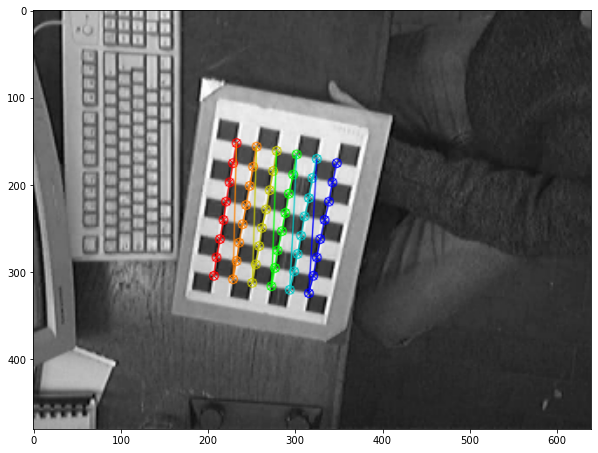

Procesando: ./img_cal_set1\img_cal10.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


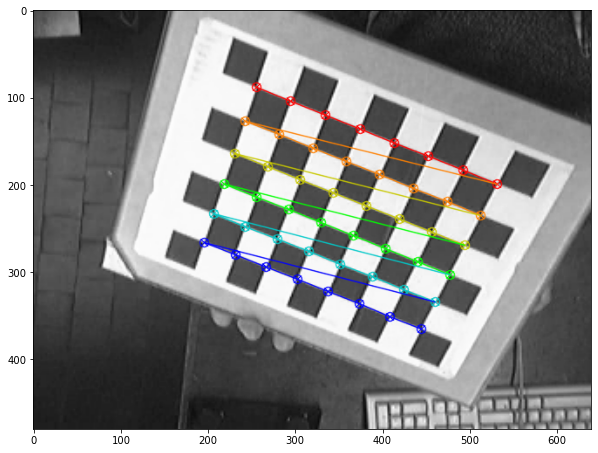

Procesando: ./img_cal_set1\img_cal11.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


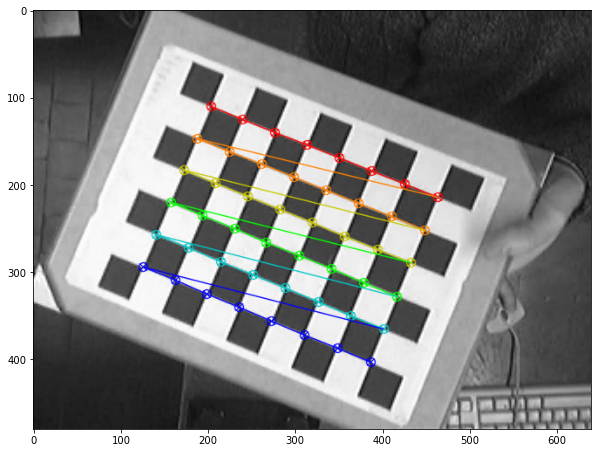

Procesando: ./img_cal_set1\img_cal12.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


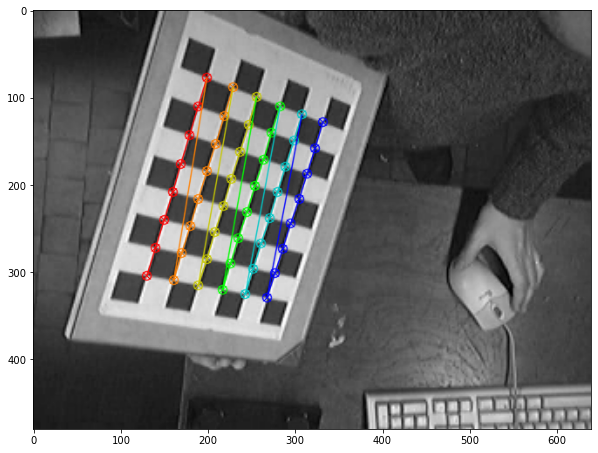

Procesando: ./img_cal_set1\img_cal13.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


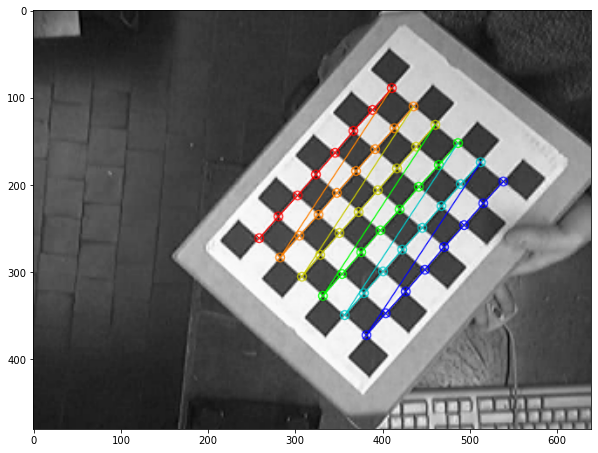

Procesando: ./img_cal_set1\img_cal14.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


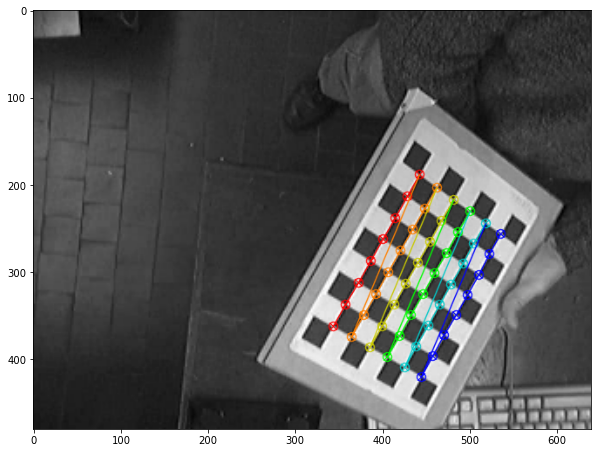

Procesando: ./img_cal_set1\img_cal15.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


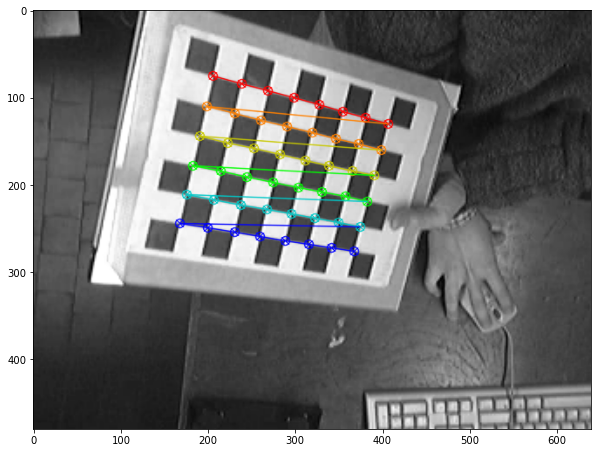

Procesando: ./img_cal_set1\img_cal16.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


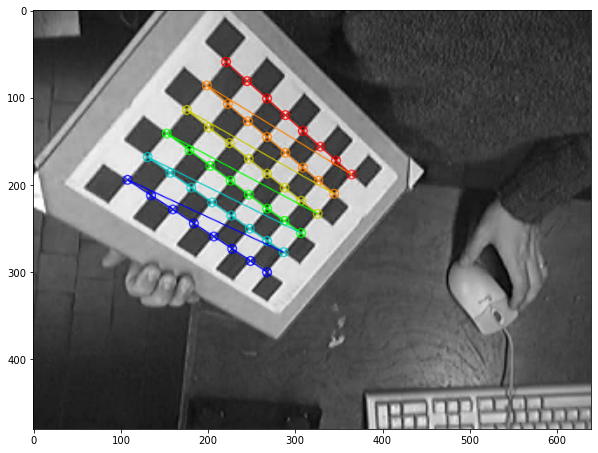

Procesando: ./img_cal_set1\img_cal17.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


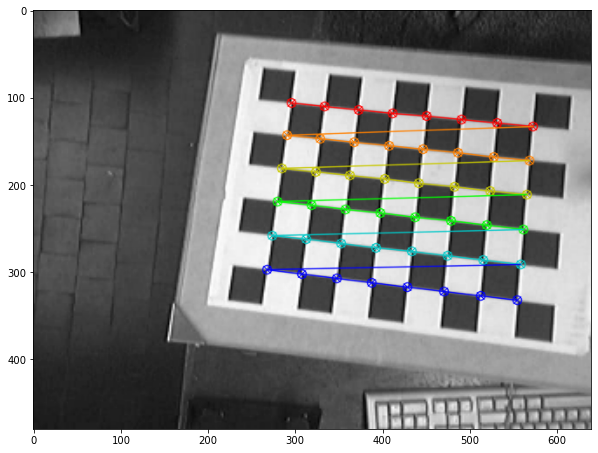

Procesando: ./img_cal_set1\img_cal18.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


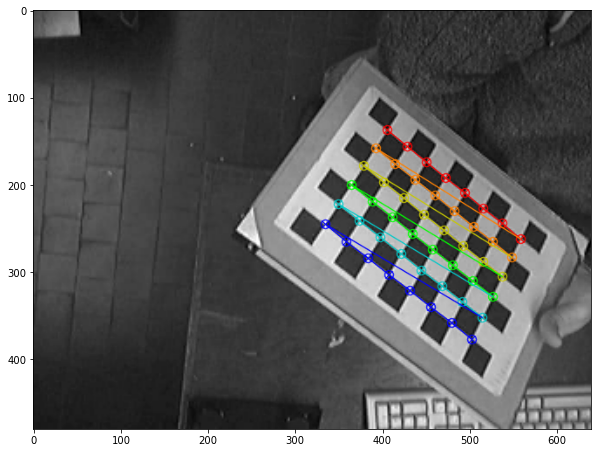

Procesando: ./img_cal_set1\img_cal19.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


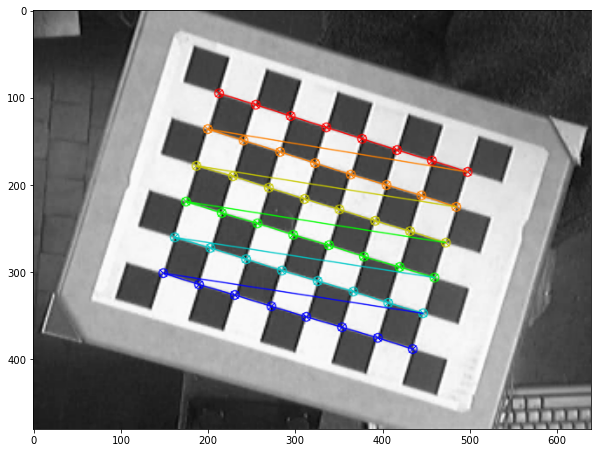

Procesando: ./img_cal_set1\img_cal2.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


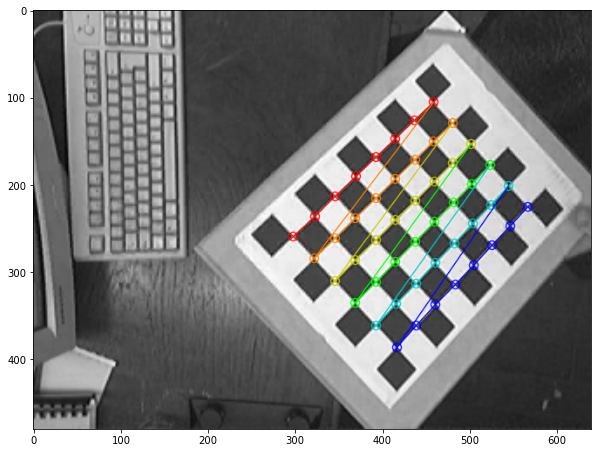

Procesando: ./img_cal_set1\img_cal20.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


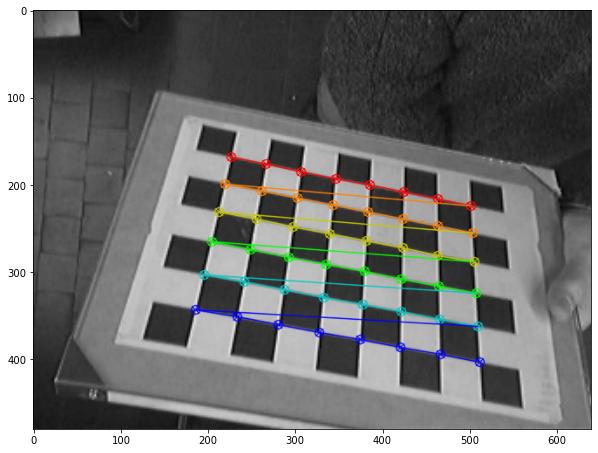

Procesando: ./img_cal_set1\img_cal3.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


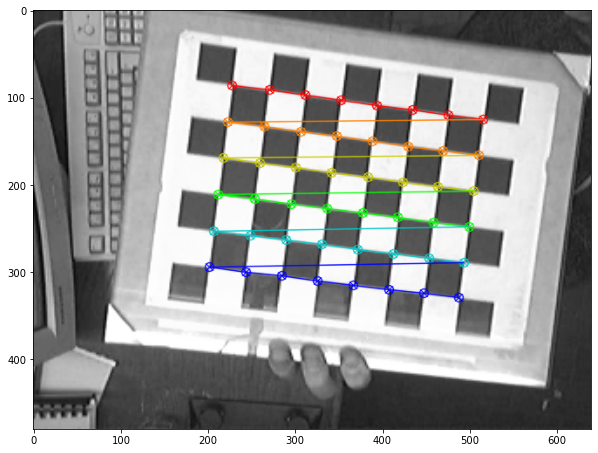

Procesando: ./img_cal_set1\img_cal4.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


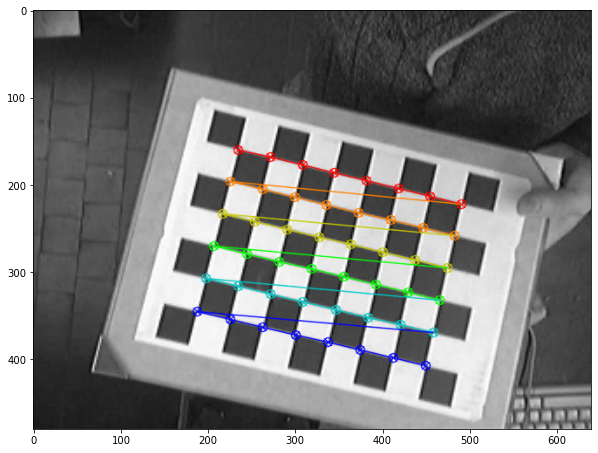

Procesando: ./img_cal_set1\img_cal5.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


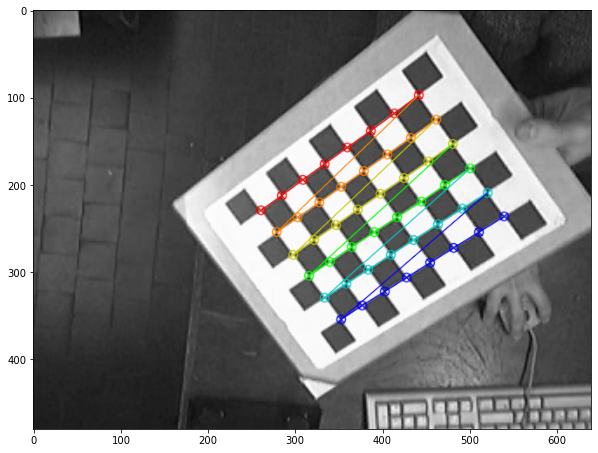

Procesando: ./img_cal_set1\img_cal6.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


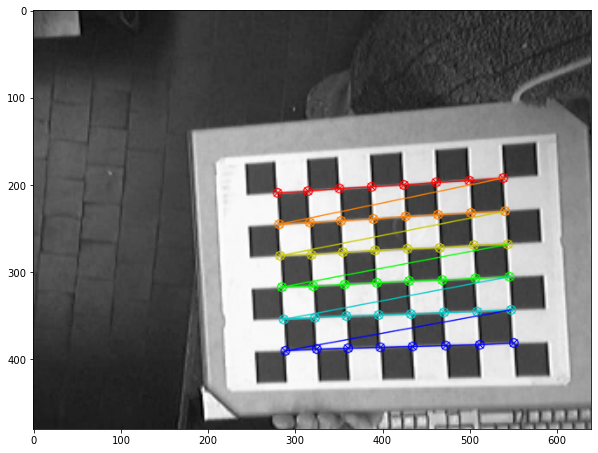

Procesando: ./img_cal_set1\img_cal7.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


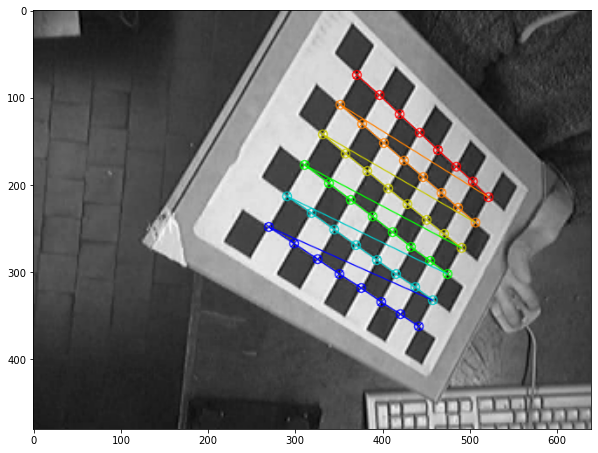

Procesando: ./img_cal_set1\img_cal8.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


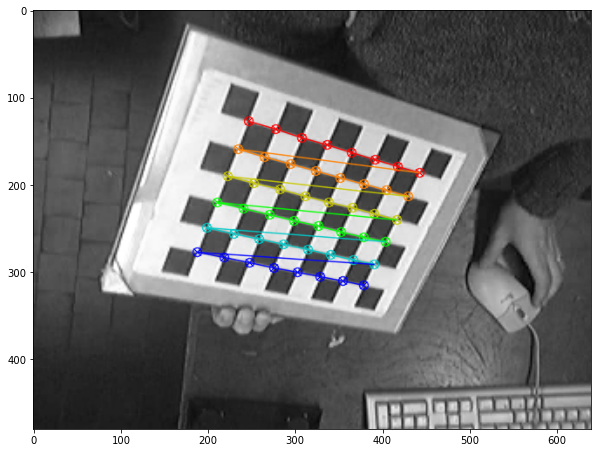

Procesando: ./img_cal_set1\img_cal9.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


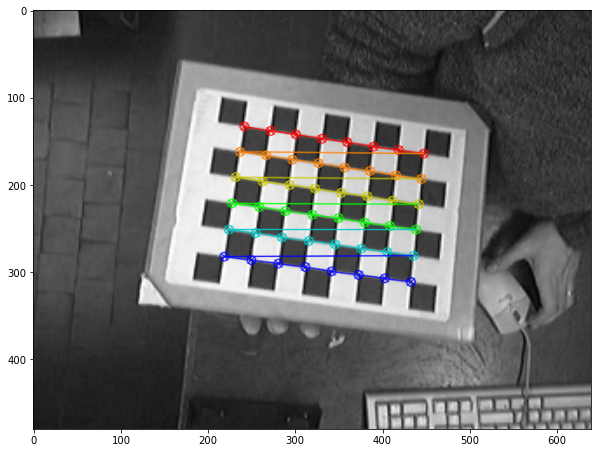


Tiempo de procesamiento 10.19529390335083 segundos


In [6]:
obj_points_set1, img_points_set1 = encontrar_esquinas(set1_fotos)

Tomando como referencia el borde blanco más grande, se puede ver que en algunas imágenes la terna se encuentra en otro lado. Por esta razón, voy a quitar algunas imágenes del set para así obtener una mejor calibración.

In [7]:
def index_fotos(set_fotos):
    for i in range(len(set_fotos)):
        print(i, set_fotos[i])

In [8]:
index_fotos(set1_fotos)

0 ./img_cal_set1\img_cal1.png
1 ./img_cal_set1\img_cal10.png
2 ./img_cal_set1\img_cal11.png
3 ./img_cal_set1\img_cal12.png
4 ./img_cal_set1\img_cal13.png
5 ./img_cal_set1\img_cal14.png
6 ./img_cal_set1\img_cal15.png
7 ./img_cal_set1\img_cal16.png
8 ./img_cal_set1\img_cal17.png
9 ./img_cal_set1\img_cal18.png
10 ./img_cal_set1\img_cal19.png
11 ./img_cal_set1\img_cal2.png
12 ./img_cal_set1\img_cal20.png
13 ./img_cal_set1\img_cal3.png
14 ./img_cal_set1\img_cal4.png
15 ./img_cal_set1\img_cal5.png
16 ./img_cal_set1\img_cal6.png
17 ./img_cal_set1\img_cal7.png
18 ./img_cal_set1\img_cal8.png
19 ./img_cal_set1\img_cal9.png


In [9]:
def new_set(set_fotos, index):
    new_set=[]
    
    for i in index:
        new_set.append(set_fotos[i])
    return new_set

In [10]:
set1_index = [0,3,5,8,9,10,11,12,3,4]
set1 = new_set(set1_fotos,set1_index)

print("Set1: Hay {} fotos del tablero".format(len(set1)))

Set1: Hay 10 fotos del tablero


In [11]:
ver_imgs=False
obj_points_set1, img_points_set1 = encontrar_esquinas(set1)

Procesando: ./img_cal_set1\img_cal1.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal12.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal14.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal17.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal18.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal19.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal2.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal20.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set1\img_cal12.png... Encontramos esquinas!
Buscando esquinas en res

Ahora voy a buscar las esquinas en el segundo set de imágenes:

Procesando: ./img_cal_set2\img_cal1.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


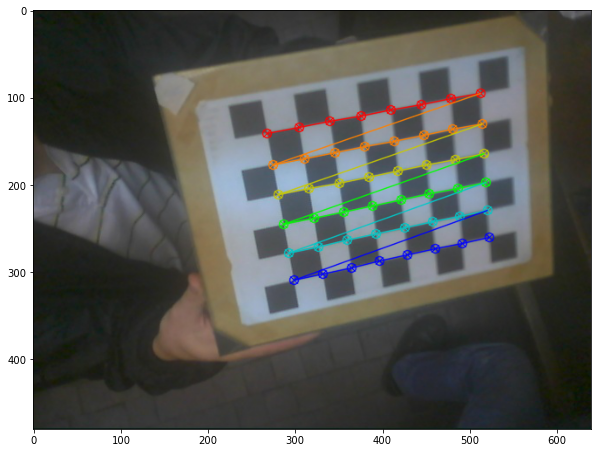

Procesando: ./img_cal_set2\img_cal10.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


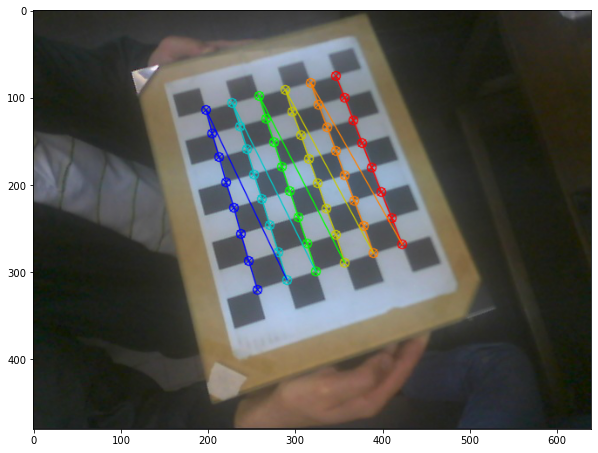

Procesando: ./img_cal_set2\img_cal2.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


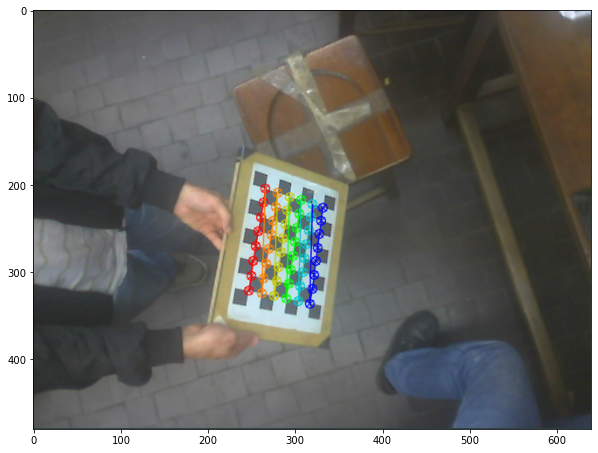

Procesando: ./img_cal_set2\img_cal3.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


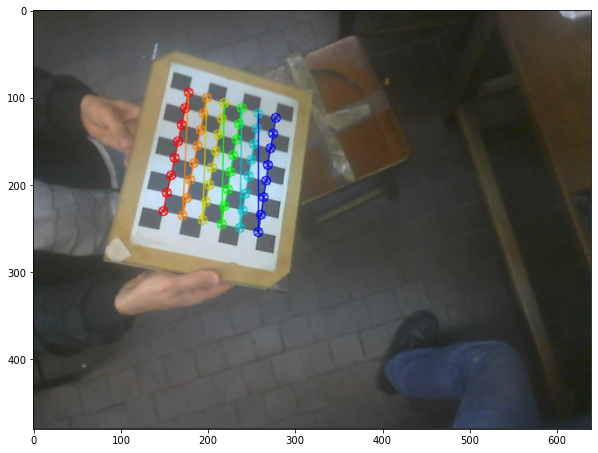

Procesando: ./img_cal_set2\img_cal4.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


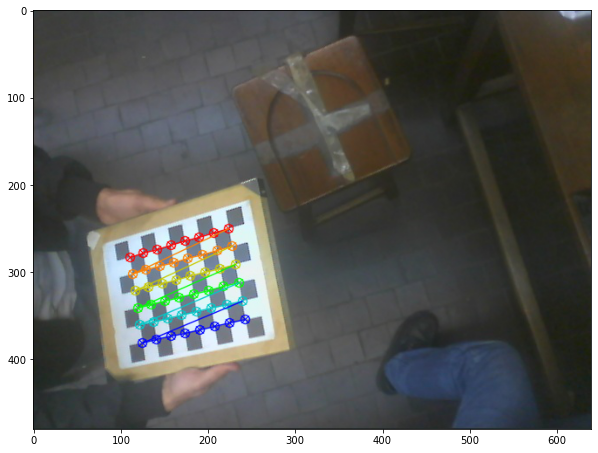

Procesando: ./img_cal_set2\img_cal5.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


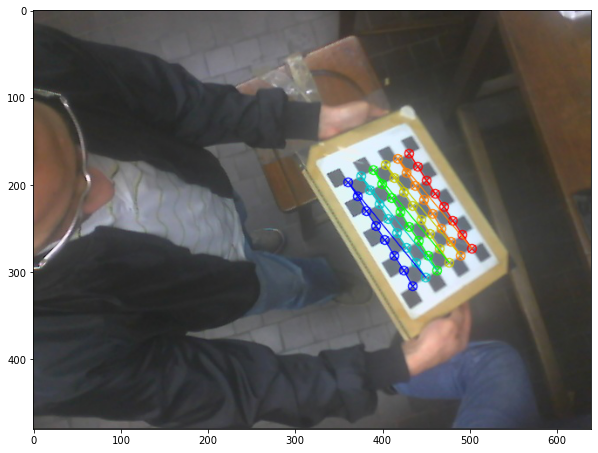

Procesando: ./img_cal_set2\img_cal6.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


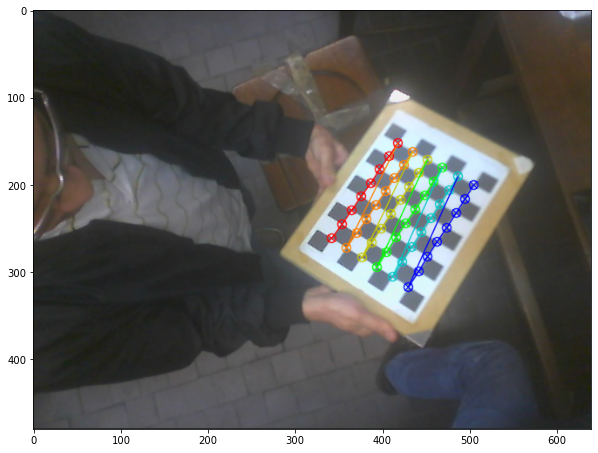

Procesando: ./img_cal_set2\img_cal7.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


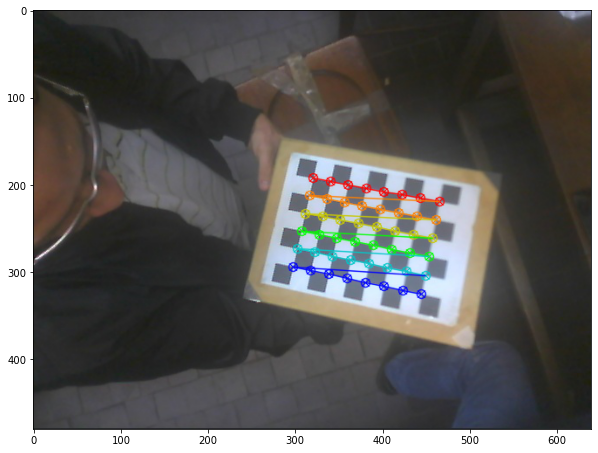

Procesando: ./img_cal_set2\img_cal8.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


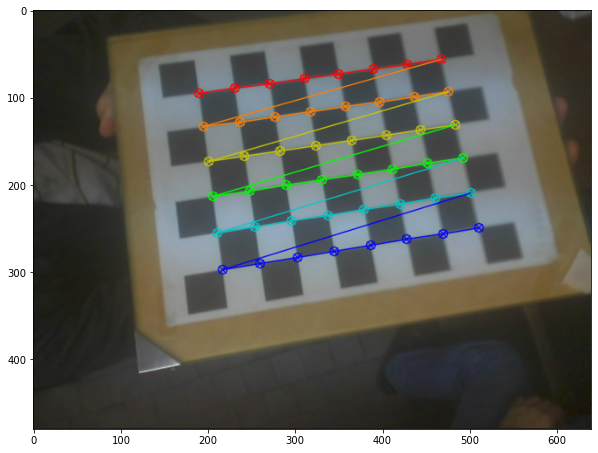

Procesando: ./img_cal_set2\img_cal9.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


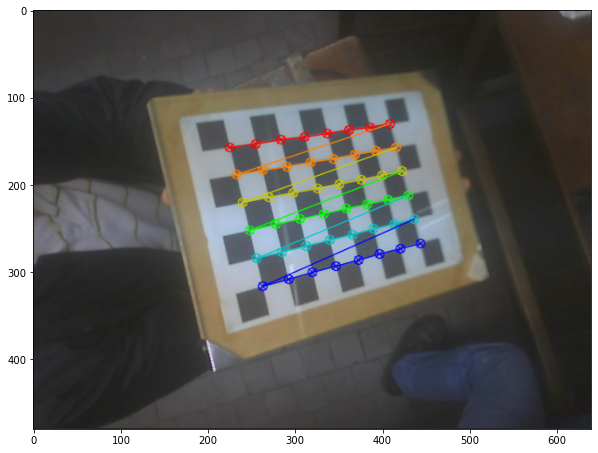


Tiempo de procesamiento 6.349153995513916 segundos


In [12]:
ver_imgs=True
obj_points_set2, img_points_set2 = encontrar_esquinas(set2_fotos)

Ocurre lo mismo que con el otro set donde, tomando como referencia el borde blanco más grande, en algunas imágenes la terna se encuentra en otro lado. Por esa razón, las voy a quitar del set.

In [13]:
index_fotos(set2_fotos)

0 ./img_cal_set2\img_cal1.jpg
1 ./img_cal_set2\img_cal10.jpg
2 ./img_cal_set2\img_cal2.jpg
3 ./img_cal_set2\img_cal3.jpg
4 ./img_cal_set2\img_cal4.jpg
5 ./img_cal_set2\img_cal5.jpg
6 ./img_cal_set2\img_cal6.jpg
7 ./img_cal_set2\img_cal7.jpg
8 ./img_cal_set2\img_cal8.jpg
9 ./img_cal_set2\img_cal9.jpg


In [14]:
set2_index = [1,5,7,8]
set2 = new_set(set2_fotos,set2_index)

print("Set2: Hay {} fotos del tablero".format(len(set2)))

Set2: Hay 4 fotos del tablero


In [15]:
ver_imgs=False
obj_points_set2, img_points_set2 = encontrar_esquinas(set2)

Procesando: ./img_cal_set2\img_cal10.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set2\img_cal5.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set2\img_cal7.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!
Procesando: ./img_cal_set2\img_cal8.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!

Tiempo de procesamiento 0.09872698783874512 segundos


## 1.2 Calibración intrínseca

Utilizamos la funcion `calibrateCamera` que tiene como parámetros los puntos objeto, los puntos imagen y el tamaño de la imagen.

Esta función devuelve los siguientes valores:
+ ret: boolean si funcionó o no
+ mtx: matriz de la cámara (matriz de parámetros intrínsecos)
+ dist: coeficientes de distorsión
+ rvecs: vectores de rotación
+ tvecs: vectores de traslación

Empiezo con el set 1:

In [16]:
#Elijo una foto para obtener sus dimensiones

idx=0
img = cv.imread(set1[idx])
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
h, w = img_gray.shape
print('Altura: {} - Ancho: {}'.format(h,w))

Altura: 480 - Ancho: 640


In [17]:
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(obj_points_set1, img_points_set1, (w, h), None, None)

print('Matriz de la camara = ')
print(mtx)

print('\nCoeficientes de distorsion = ')
print(dist)

Matriz de la camara = 
[[808.76072566   0.         314.91967927]
 [  0.         808.95652192 240.03546094]
 [  0.           0.           1.        ]]

Coeficientes de distorsion = 
[[ 0.06243353 -0.12168508 -0.0037736  -0.00122221 -0.07015405]]


Ahora con el set 2:

In [18]:
ret, mtx2, dist2, rvecs2, tvecs2 = cv.calibrateCamera(obj_points_set2, img_points_set2, (w, h), None, None)

print('Matriz de la camara = ')
print(mtx2)

print('\nCoeficientes de distorsion = ')
print(dist2)

Matriz de la camara = 
[[674.77672609   0.         335.31688295]
 [  0.         678.86224573 229.47909792]
 [  0.           0.           1.        ]]

Coeficientes de distorsion = 
[[ 7.94878690e-02 -2.26245419e-01 -1.22821452e-03  3.42913040e-04
   2.55208318e+00]]


Con los resultados obtenidos considero que el set de imágenes 1 es el mejor, ya que en la matriz K tenemos como valores de la distancia focal a fx=808.7607 y fy=808.9565. De esta manera como fx≈fy, tendríamos una lente con una casi simetría perfecta.  

## 1.3 Dibujo

Realizo un dibujo de la terna para poder observar que en todas las imágenes tienen el mismo punto de la terna. Para esto, utilizo todos los datos obtenidos anteriormente en la calibración.

In [19]:
# Vertices 28x28
esq_3d = np.float32([[0,0,0], [0,28,0], [28,28,0], [28,0,0],
                        [0,0,-28],[0,28,-28],[28,28,-28],[28,0,-28]])

In [20]:
print('Vectores de rotacion = ')
for i in range(10):
    print("Foto",i+1, "\n",rvecs[i])

Vectores de rotacion = 
Foto 1 
 [[ 0.22181693]
 [ 0.20055227]
 [-1.36475225]]
Foto 2 
 [[ 0.56431633]
 [-0.33764553]
 [-1.23714201]]
Foto 3 
 [[ 0.34996238]
 [-0.29715631]
 [-1.0072644 ]]
Foto 4 
 [[-0.17734627]
 [ 0.10069037]
 [ 0.12564355]]
Foto 5 
 [[-0.42261999]
 [-0.27623827]
 [ 0.61746243]]
Foto 6 
 [[-0.00593526]
 [-0.04088526]
 [ 0.29964509]]
Foto 7 
 [[-0.05465898]
 [-0.27353594]
 [-0.74987353]]
Foto 8 
 [[-0.66757493]
 [-0.14443384]
 [ 0.16053189]]
Foto 9 
 [[ 0.56431633]
 [-0.33764553]
 [-1.23714201]]
Foto 10 
 [[-0.11913367]
 [ 0.05047272]
 [-0.84521149]]


In [21]:
print('Vectores de traslacion = ')
for i in range(10):
    print("Foto",i+1, "\n",tvecs[i])

Vectores de traslacion = 
Foto 1 
 [[-135.88771177]
 [  79.8154489 ]
 [1018.64286091]]
Foto 2 
 [[-154.16461276]
 [  53.38379498]
 [ 677.08839608]]
Foto 3 
 [[ 27.81944624]
 [118.0747042 ]
 [781.86423682]]
Foto 4 
 [[-13.78820232]
 [-97.13265351]
 [588.92367251]]
Foto 5 
 [[ 87.34075983]
 [-98.083573  ]
 [775.9640869 ]]
Foto 6 
 [[-66.43376952]
 [-94.15366263]
 [528.00445765]]
Foto 7 
 [[-13.45418149]
 [ 15.02415401]
 [644.76321053]]
Foto 8 
 [[-59.97619221]
 [-49.18180743]
 [554.63405323]]
Foto 9 
 [[-154.16461276]
 [  53.38379498]
 [ 677.08839608]]
Foto 10 
 [[-47.88012948]
 [ 18.07834657]
 [691.72845326]]


In [22]:
def dibujar_eje(idx,set_imgs):

    esquinas_2d, _ = cv.projectPoints(esq_3d,rvecs[idx],tvecs[idx],mtx,dist)
    esq_2d = esquinas_2d[:,0, :]

    r = (0, 0, 255)  # r (in BGR)
    b = (255, 0, 0)  # b (in BGR)
    g = (0, 255, 0)  # g (in BGR)
    line_width = 3
    
    img=cv.imread(set_imgs[idx])

    #Redondeamos los valores de los puntos porque cv.line no toma puntos en np.float32
    esq_round = []
    for esquina in esq_2d:
        x = round(esquina[0])
        y = round(esquina[1])
        
        round_points = (x,y)
        esq_round.append(round_points)

    # Eje x
    cv.line(img, esq_round[0], esq_round[1], r, line_width)
    
    # Eje y
    cv.line(img, esq_round[0], esq_round[3], g, line_width)

    # Eje z
    cv.line(img, esq_round[0], esq_round[4], b, line_width)

    plt.figure(figsize=(10,8))
    plt.imshow(img[..., ::-1])
    plt.show()

Dibujando en la imagen  1


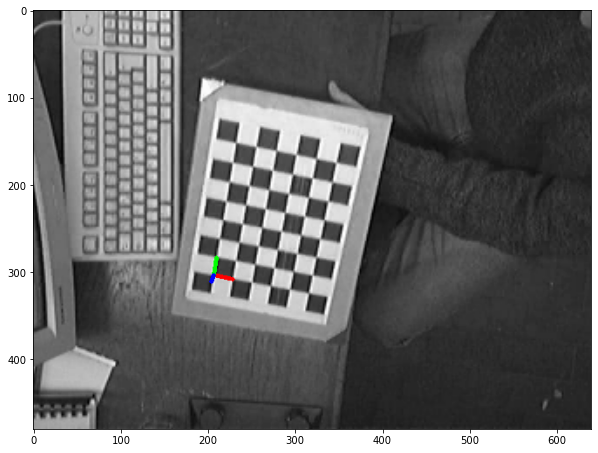

Dibujando en la imagen  2


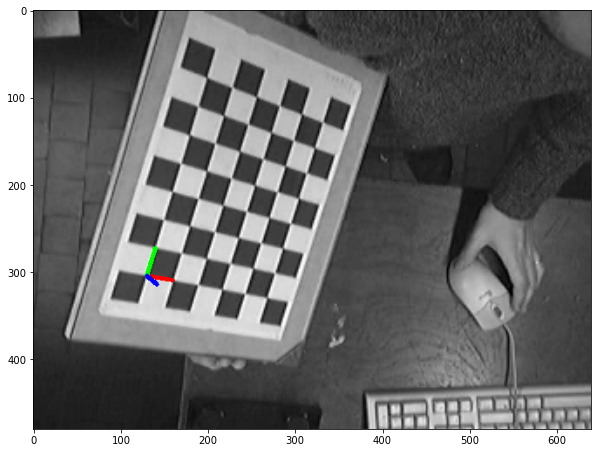

Dibujando en la imagen  3


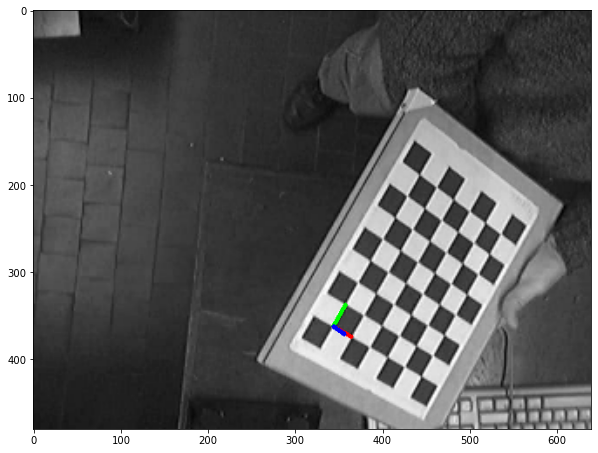

Dibujando en la imagen  4


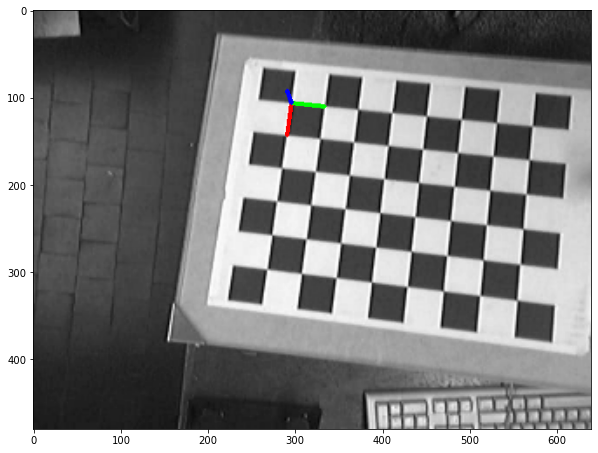

Dibujando en la imagen  5


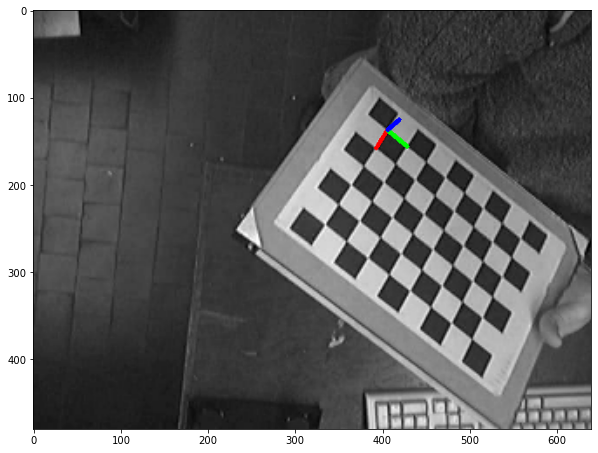

Dibujando en la imagen  6


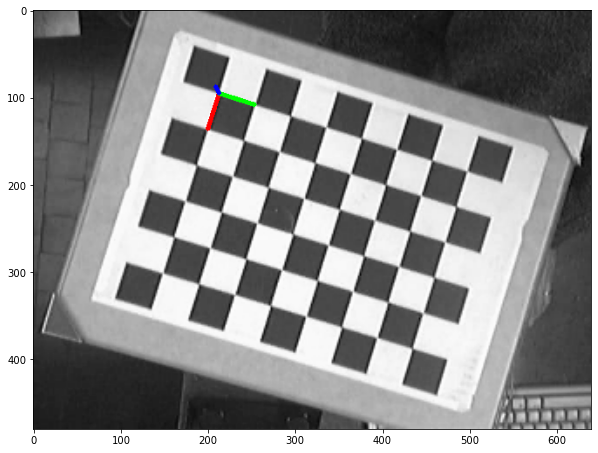

Dibujando en la imagen  7


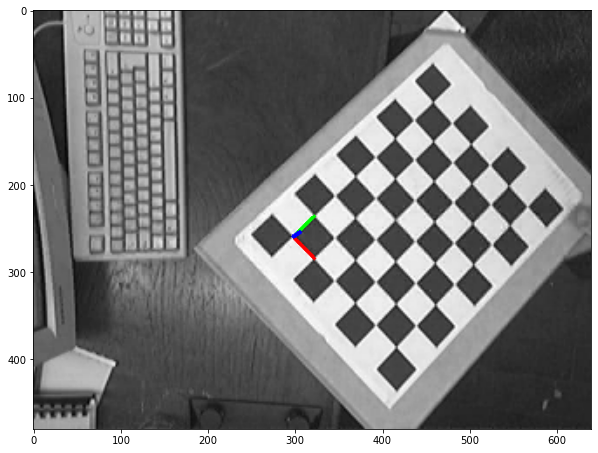

Dibujando en la imagen  8


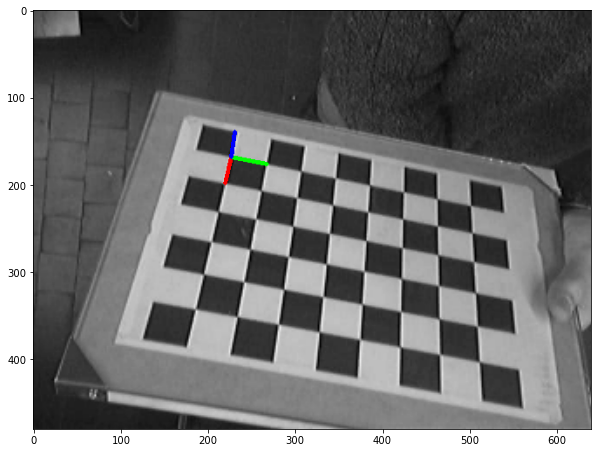

Dibujando en la imagen  9


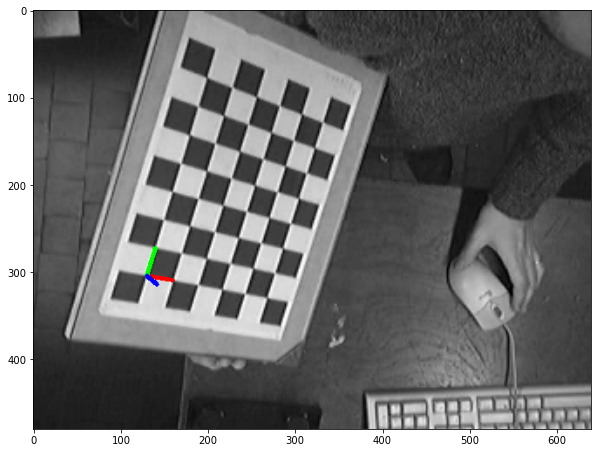

Dibujando en la imagen  10


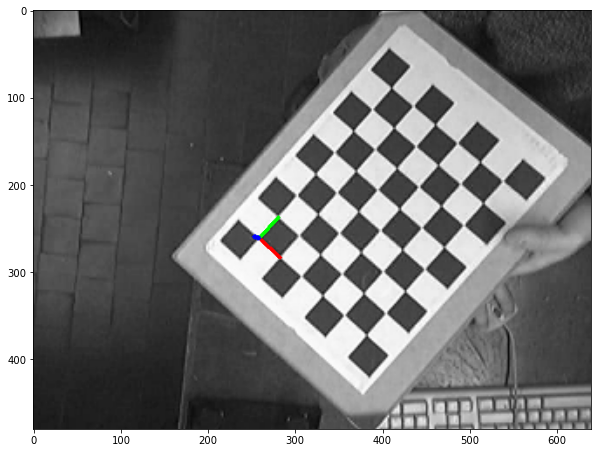

In [23]:
for i in range(len(set1)):
    print("Dibujando en la imagen ", i+1)
    dibujar_eje(i,set1)

# 2) Calibración de los parámetros extrínsecos

Los valores obtenidos antes de rvecs y tvecs no sirven para armar la matriz $\begin{bmatrix}
R & t 
\end{bmatrix}$ porque son los valores obtenidos en el set de imágenes del patrón desde distintos ángulos. 

Ahora se necesitan los parámetros extrínsecos de lo que es la zona de trabajo. Para esto se cuenta con el archivo imgCalExtr.png para poder hacer la calibración.

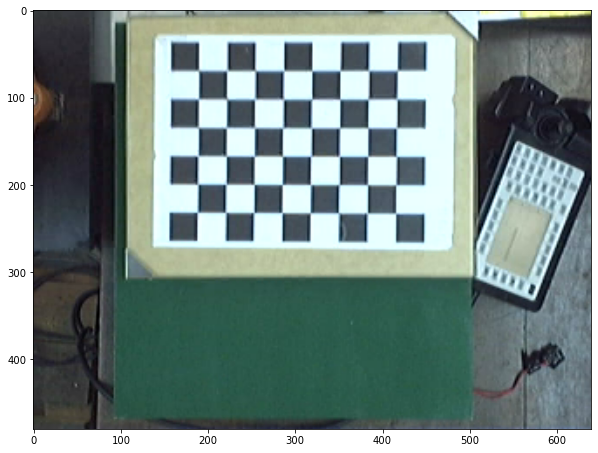

In [24]:
imgCalExtr = glob.glob('./img_bloques/imgCalExtr.png')

img = cv.imread(imgCalExtr[0])
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.figure(figsize=(10,8))
plt.imshow(imgRGB)
plt.show()

Busco las esquinas en esa imagen:

Procesando: ./img_bloques/imgCalExtr.png... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


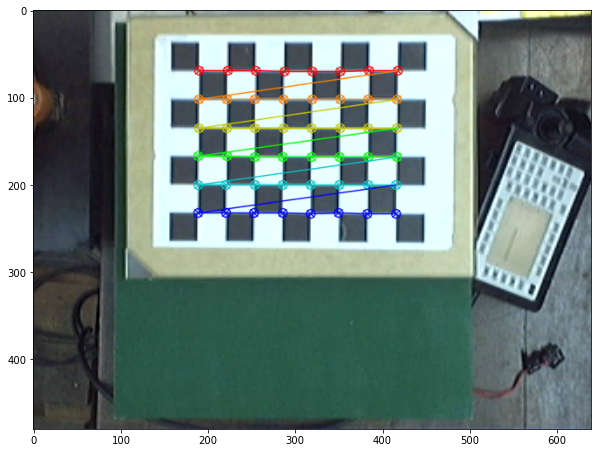


Tiempo de procesamiento 0.5016627311706543 segundos


In [25]:
ver_imgs=True
obj_points_CalExtr, img_points_CalExtr = encontrar_esquinas(imgCalExtr)

Ahora voy a tener que usar la matriz de la cámara y los coeficientes de distorsión en la funcion `solvePnP` para encontrar el vector de rotación y el vector de traslación de esta imagen.

In [26]:
print('Matriz de la camara = ')
print(mtx)

print('\nCoeficientes de distorsion = ')
print(dist)

Matriz de la camara = 
[[808.76072566   0.         314.91967927]
 [  0.         808.95652192 240.03546094]
 [  0.           0.           1.        ]]

Coeficientes de distorsion = 
[[ 0.06243353 -0.12168508 -0.0037736  -0.00122221 -0.07015405]]


In [27]:
ret, rvec, tvec = cv.solvePnP(obj_points_CalExtr[0],img_points_CalExtr[0],mtx,dist)

In [28]:
print('Vector de rotacion = ')
print(rvec)

Vector de rotacion = 
[[-0.01249176]
 [ 0.04245331]
 [ 0.00777423]]


In [29]:
print('Vector de traslacion = ')
print(tvec)

Vector de traslacion = 
[[-107.8827089 ]
 [-147.21046182]
 [ 702.89860173]]


Como en realidad necesito la matriz de rotación, aplico la función `Rodrigues` que convierte un vector de rotación en una matriz.

In [30]:
rmatrix = cv.Rodrigues(rvec)[0]

print('Matriz de rotacion = ')
print(rmatrix)

Matriz de rotacion = 
[[ 0.9990688  -0.00803673  0.04239048]
 [ 0.0075065   0.99989178  0.01265255]
 [-0.04248758 -0.01232257  0.999021  ]]


Ahora ya tenemos todos los datos necesarios.

Voy a dibujar el eje en la imagen del tablero para poder visualizar como esta ubicada la terna.

In [31]:
def dibujar_eje_cal_extr(idx,set_imgs):

    esquinas_2d, _ = cv.projectPoints(esq_3d,rvec,tvec,mtx,dist)
    esq_2d = esquinas_2d[:,0, :]

    r = (0, 0, 255)  # r (in BGR)
    b = (255, 0, 0)  # b (in BGR)
    g = (0, 255, 0)  # g (in BGR)
    line_width = 3
    
    img=cv.imread(set_imgs[idx])

    #Redondeamos los valores de los puntos porque cv.line no toma puntos en np.float32
    esq_round = []
    for esquina in esq_2d:
        x = round(esquina[0])
        y = round(esquina[1])
        
        round_points = (x,y)
        esq_round.append(round_points)

    # Eje x
    cv.line(img, esq_round[0], esq_round[1], r, line_width)
    
    # Eje y
    cv.line(img, esq_round[0], esq_round[3], g, line_width)

    # Eje z
    cv.line(img, esq_round[0], esq_round[4], b, line_width)

    plt.figure(figsize=(10,8))
    plt.imshow(img[..., ::-1])
    plt.show()

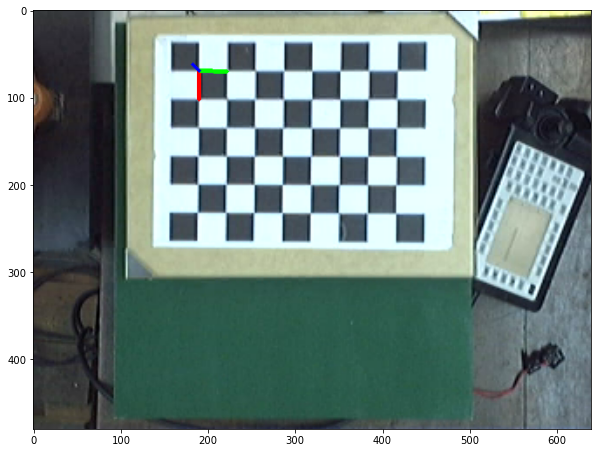

In [32]:
dibujar_eje_cal_extr(0,imgCalExtr)

# 3) Algoritmo de búsqueda de bloques

Cargo el set de fotos de los bloques

In [33]:
bloques = []
for img in glob.glob('./img_bloques/imgBloque?.*'):
    bloques.append(img)
    
for img in glob.glob('./img_bloques/imgBloque1?.*'):
    bloques.append(img)
    
bloques

['./img_bloques\\imgBloque1.png',
 './img_bloques\\imgBloque2.png',
 './img_bloques\\imgBloque3.png',
 './img_bloques\\imgBloque4.png',
 './img_bloques\\imgBloque5.png',
 './img_bloques\\imgBloque6.png',
 './img_bloques\\imgBloque7.png',
 './img_bloques\\imgBloque8.png',
 './img_bloques\\imgBloque9.png',
 './img_bloques\\imgBloque10.png',
 './img_bloques\\imgBloque11.png',
 './img_bloques\\imgBloque12.png',
 './img_bloques\\imgBloque13.png',
 './img_bloques\\imgBloque14.png',
 './img_bloques\\imgBloque15.png']

## 3.1 Contornos

Con la función `findContours` voy a hallar los contornos de la imagen para así encontrar donde está el bloque, pero antes voy a aplicar en las imágenes distintas operaciones para poder obtener correctamente los contornos.

Como primer paso voy a hacer un recorte de la imagen, es decir, defino el field of view (fov) para centrarme en el área donde se encuentra el bloque.

Luego, aplico una binarización Otzu la cual busca sobre toda la imagen un umbral que divida en dos las intensidades, haciendo que adentro de una intensidad la varianza sea lo mas chica posible, y que la separación entre intensidades distintas sea lo mas grande posible. Recibe como parámetros a la imagen original, un valor del umbral, un valor máximo y el método a utilizar.

Finalmente, aplico la función `findContours`.



Como con esta función se encuentran todos los bordes presentes, discrimino aquellos que encierran una área menor a 10.000, puesto que no representan al bloque sino que es ruido generado por el procesamiento de la imagen.


Dibujo el contorno y el centro para obtener una visualización de que se encontraron correctamente los bloques y además obtengo varias mediciones de los mismos.

In [34]:
def hallar_contornos(imagen):
    #Recorte seccion de trabajo
    fov = imagen[10:460,80:500]
    fov_gray=cv.cvtColor(fov, cv.COLOR_RGB2GRAY)
    
    #Binarizacion
    ret, img_otzu = cv.threshold(fov_gray,120,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
    
    #Buscamos los contornos
    contours, hierarchy = cv.findContours(img_otzu, cv.RETR_TREE, cv.CHAIN_APPROX_NONE, offset=(80,10))
    
    return contours

In [35]:
def dibujar_contornos(imagen,cnt):
    
    #Dibujo contornos
    cv.drawContours(imagen, [cnt], 0, (255,0,0), 2)
            
    # Centroide
    M = cv.moments(cnt)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    cv.circle(imagen,(cx,cy),3,(0,0,255),2)
            
    # Perimetro
    p = cv.arcLength(cnt,False)
    
    # Area
    area = cv.contourArea(cnt)
            
    # Orientacion en sentido antihorario
    (x,y),(MA,ma),angulo = cv.fitEllipse(cnt)
            
    #Dimension, vertices y centro
    (centro, dimension, a) = cv.minAreaRect(cnt)
    box = cv.boxPoints((centro, dimension, a))
            
    centrox = centro[0]
    centroy = centro[1]
            
        
    print(' Centro: ({},{})\n Perimetro: {} \n Área: {} \n Dimension: {} \n Orientación: {}'
            .format(centrox,centroy, p, area, dimension, angulo))
    
    return centro,box

In [36]:
def buscar_bloques(set_imgs):
    i=1
    centros=[]
    vertices=[]

    for img in set_imgs:
        img = cv.imread(img)
        imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    
        contours = hallar_contornos(imgRGB)

        img_out = imgRGB.copy()
    
        #Itero en los contornos encontrados
        for cnt in contours:
            area = cv.contourArea(cnt)
    
            if area > 10000:
                print('Bloque {}'.format(i))
                centro, box = dibujar_contornos(img_out,cnt)
                centros.append(centro)
                vertices.append(box)
            
        plt.figure()
        plt.imshow(img_out)
        plt.show()
    
        i+=1
    
    return centros,vertices

Bloque 1
 Centro: (351.501220703125,129.08563232421875)
 Perimetro: 455.5361396074295 
 Área: 11127.0 
 Dimension: (150.34519958496094, 75.9468765258789) 
 Orientación: 47.75871276855469


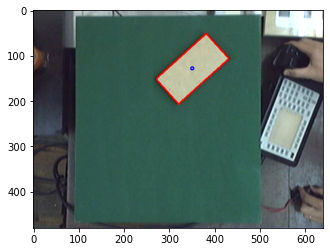

Bloque 2
 Centro: (298.0860595703125,156.42288208007812)
 Perimetro: 450.87928545475006 
 Área: 10997.5 
 Dimension: (75.25286102294922, 149.0936279296875) 
 Orientación: 138.34194946289062


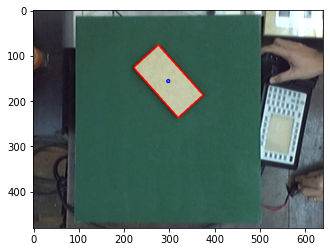

Bloque 3
 Centro: (414.25823974609375,151.38162231445312)
 Perimetro: 480.87214517593384 
 Área: 11194.0 
 Dimension: (76.36144256591797, 150.14720153808594) 
 Orientación: 155.65530395507812


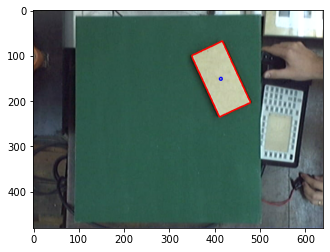

Bloque 4
 Centro: (178.52890014648438,361.8793640136719)
 Perimetro: 481.6589421033859 
 Área: 11377.5 
 Dimension: (78.36514282226562, 150.0324249267578) 
 Orientación: 157.02719116210938


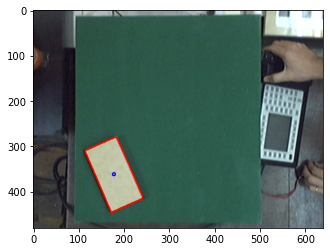

Bloque 5
 Centro: (299.08270263671875,355.94378662109375)
 Perimetro: 453.95035314559937 
 Área: 11103.0 
 Dimension: (150.06338500976562, 75.59065246582031) 
 Orientación: 45.95008850097656


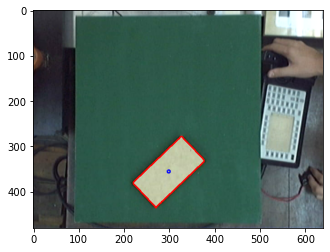

Bloque 6
 Centro: (408.3655700683594,358.7862548828125)
 Perimetro: 479.61225962638855 
 Área: 11274.5 
 Dimension: (76.02567291259766, 152.0839080810547) 
 Orientación: 149.82369995117188


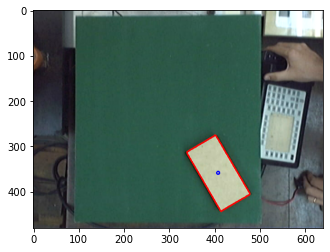

Bloque 7
 Centro: (392.03448486328125,271.41375732421875)
 Perimetro: 478.9310202598572 
 Área: 11124.0 
 Dimension: (150.0418243408203, 75.76368713378906) 
 Orientación: 21.743484497070312


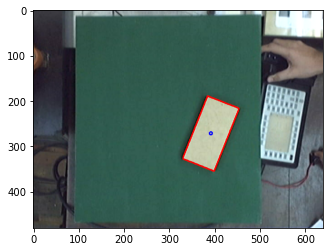

Bloque 8
 Centro: (279.3787841796875,266.173583984375)
 Perimetro: 476.20309841632843 
 Área: 10967.5 
 Dimension: (75.42256164550781, 149.452392578125) 
 Orientación: 159.81674194335938


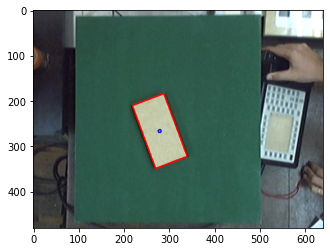

Bloque 9
 Centro: (150.64500427246094,258.48431396484375)
 Perimetro: 479.4751765727997 
 Área: 11248.0 
 Dimension: (148.94139099121094, 77.56439971923828) 
 Orientación: 19.635845184326172


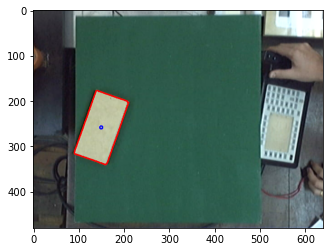

Bloque 10
 Centro: (170.58218383789062,144.7808074951172)
 Perimetro: 477.2152910232544 
 Área: 11145.0 
 Dimension: (76.05697631835938, 150.3759765625) 
 Orientación: 155.5127410888672


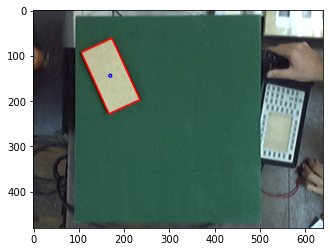

Bloque 11
 Centro: (225.54696655273438,129.08367919921875)
 Perimetro: 463.7665876150131 
 Área: 11255.5 
 Dimension: (148.8453369140625, 77.264892578125) 
 Orientación: 38.232234954833984


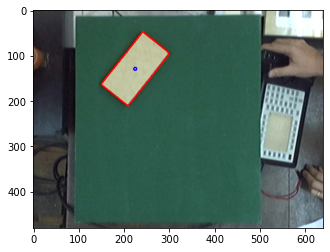

Bloque 12
 Centro: (269.2541809082031,129.646240234375)
 Perimetro: 469.0365778207779 
 Área: 11004.0 
 Dimension: (75.17633056640625, 150.6797637939453) 
 Orientación: 168.99366760253906


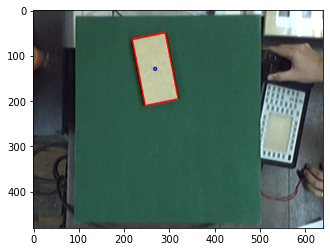

Bloque 13
 Centro: (365.0706787109375,125.98043060302734)
 Perimetro: 480.0193328857422 
 Área: 11118.0 
 Dimension: (151.41600036621094, 75.38736724853516) 
 Orientación: 17.060081481933594


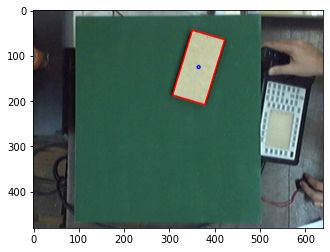

Bloque 14
 Centro: (304.80267333984375,225.82376098632812)
 Perimetro: 470.5117543935776 
 Área: 10952.5 
 Dimension: (75.3266372680664, 149.15847778320312) 
 Orientación: 122.3547592163086


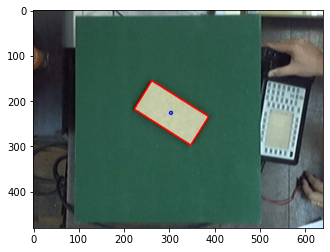

Bloque 15
 Centro: (374.8202209472656,318.88763427734375)
 Perimetro: 474.5117543935776 
 Área: 11131.5 
 Dimension: (75.89583587646484, 150.51968383789062) 
 Orientación: 122.28961181640625


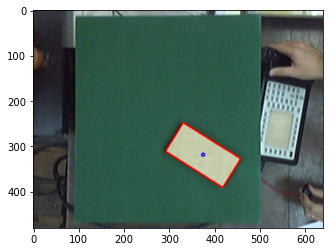

In [37]:
centros, vertices = buscar_bloques(bloques)

## 3.2 Centro del bloque en mm

\begin{equation}
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} \ \ = \ \ [ K ]
\ \ F_{dist}\left(
\begin{bmatrix}
R & t 
\end{bmatrix}
\begin{bmatrix}
x_w\\
y_w\\
z_w\\
1
\end{bmatrix},
\begin{bmatrix}
k_1\\
k_2\\
p_1\\
p_2\\
\end{bmatrix}
\right)
\end{equation}

En los puntos anteriores obtuve la matriz de parámetros intrínsecos $K$, la matriz de parámetros extrínsecos $\begin{bmatrix}
R & t \end{bmatrix}$, los coeficientes de distorsión y el centro de cada uno de los bloques. Con todos estos datos puedo ahora hacer el pasaje de unidades de pixel a mm.

Para esto tengo que realizar los siguientes pasos:

1. Multiplicar a izquierda al punto imagen $\vec u$ por la inversa de la matriz $K$

\begin{equation}
\vec u \ \ =  \ \ K
\ \ F_{dist}\left(
\begin{bmatrix}
R & t 
\end{bmatrix}
\vec X
\right)
\end{equation}

\begin{equation}
K^{-1} \ 
\vec u \ \ =  \ \  F_{dist} \left(
\begin{bmatrix}
R & t 
\end{bmatrix}
\vec X
\right)
\end{equation}

2. Resolver la inversa de la ecuación de distorsión en forma iterativa e incremental sobre $K^{-1} \ \vec u$

\begin{equation}
Fd^{-1} \left( K^{-1}
\begin{bmatrix}
u\\v\\1
\end{bmatrix}\right) = 
\begin{bmatrix}R & \vec t \end{bmatrix}
\vec Xw
\end{equation}

   Para la ecuación de distorsión solo vamos a tener en cuenta el valor de $k_1$

\begin{equation}
\begin{bmatrix}
x_d\\y_d
\end{bmatrix} = ( 1 + k_1 \ r^2 )
\begin{bmatrix}
x_l\\y_l
\end{bmatrix}
\end{equation}

\begin{equation}
r^2 = xl^2 + yl^2
\end{equation}

   Para resolver vamos a aplicar Taylor

\begin{equation}
K^{-1} \ 
\vec u \ \ = 
Fd \left(
\begin{bmatrix}
R & \vec t 
\end{bmatrix}
\vec Xw,
\begin{bmatrix}
k1
\end{bmatrix}
\right)
= \vec xd
\end{equation}

\begin{equation}
\vec xd = 
Fd \left(
\vec x_0
\right) +
J * \left(
\vec x_l - \vec x_0
\right)
\end{equation}

\begin{equation}
\vec x_l = \vec x_0 + J^{-1} *
\left( 
\vec x_d -
Fd (\vec x_0) 
\right) = 
\vec x_0 + J^{-1} *
\Delta x
\end{equation}

   **Algoritmo iterativo:**
1. $ \vec x_0 = \vec x_d$
2. $ \Delta x = \vec x_d - Fd (\vec x_0) $
3. $ \vec x_l = \vec x_0 + J^{-1} * \Delta x$
4. $ \vec x_0 = \vec x_l$

Y volvemos al punto 2


3. Resolver la inversa de la matriz de parámetros extrínsecos con la restricción $z_w = 0$, debido a que la matriz $\begin{bmatrix}R & \vec t \end{bmatrix}$ es una matriz de 3x4, por lo que no la podemos invertir si no la reestringimos a un plano.

\begin{equation}
Fd^{-1} \left( K^{-1} \ 
\vec u \ \ \right) = 
\begin{bmatrix}r1 & r2 & r3 & t \end{bmatrix}
\begin{bmatrix}
xw\\
yw\\
0\\
1
\end{bmatrix} = 
\begin{bmatrix}r1 & r2 & t \end{bmatrix}
\begin{bmatrix}
xw\\
yw\\
1
\end{bmatrix}
\end{equation}

\begin{equation}
\lambda \ 
\begin{bmatrix}
xw\\
yw\\
1
\end{bmatrix} =
\begin{bmatrix}r1 & r2 & t \end{bmatrix}^{-1} \ 
Fd^{-1} \left( K^{-1} \ 
\vec u \ \ \right)
\end{equation}


Las coordenadas del punto objeto se obtienen despejando $\lambda$ para que el tercer elemento sea 1.

**Parámetros intrínsecos**

In [38]:
K=mtx

print('K = ')
print(K)

K = 
[[808.76072566   0.         314.91967927]
 [  0.         808.95652192 240.03546094]
 [  0.           0.           1.        ]]


In [39]:
K_inv = np.linalg.inv(K)
print('K^-1 = ')
print(K_inv)

K^-1 = 
[[ 0.00123646  0.         -0.38938547]
 [ 0.          0.00123616 -0.29672233]
 [ 0.          0.          1.        ]]


In [40]:
k1 = dist[0][0]
print('k1 =',k1)

k1 = 0.062433526275585786


**Parámetros extrínsecos**

In [41]:
R=rmatrix
print('R = ')
print(R)

R = 
[[ 0.9990688  -0.00803673  0.04239048]
 [ 0.0075065   0.99989178  0.01265255]
 [-0.04248758 -0.01232257  0.999021  ]]


In [42]:
t=tvec
print('t = ')
print(t)

t = 
[[-107.8827089 ]
 [-147.21046182]
 [ 702.89860173]]


**Función de método iterativo para resolver inversa de la función de distorsión**

In [43]:
def func_dist_iterativo(xd):
    xx = [xd]
    
    J = 1
    alfa = 0.01

    x0 = xd

    for i in range(1,1000):

        r2 = x0[0]**2 + x0[1]**2

        fd = (1 + k1 * r2) * x0

        deltax = xd - fd

        xl = x0 + alfa * J * deltax

        xx.append(xl)

        x0 = xl
      
    return xx[-1]

**Matriz [r1 r2 t]**

In [44]:
r1r2 = np.delete(R,2,1)
E = np.append(r1r2, t, 1)
print('Matriz E = [r1 r2 t] = ')
print(E)

Matriz E = [r1 r2 t] = 
[[ 9.99068796e-01 -8.03672657e-03 -1.07882709e+02]
 [ 7.50649904e-03  9.99891777e-01 -1.47210462e+02]
 [-4.24875783e-02 -1.23225678e-02  7.02898602e+02]]


In [45]:
E_inv = np.linalg.inv(E)
print('Matriz E^-1 = ')
print(E_inv)

Matriz E^-1 = 
[[1.00752233e+00 1.00296779e-02 1.56737702e-01]
 [1.40607063e-03 1.00271023e+00 2.10216845e-01]
 [6.09255873e-05 1.81848441e-05 1.43583984e-03]]


**Función para pasar datos a mm**

In [46]:
def pasar_a_mm(datos):
    datos_mm = []

    for i in range(len(datos)):

        dato = datos[i]
        u = dato[0]
        v = dato[1]

        uv = np.array([[u,v,1]]).transpose()

        xd = K_inv.dot(uv)

        xl = func_dist_iterativo(xd)
        
        r1r2 = np.delete(R,2,1)
        E = np.append(r1r2, t, 1)
        E_inv = np.linalg.inv(E)

        M = E_inv.dot(xl)

        Xw = M/M[2]

        xw = Xw[0][0]
        yw = Xw[1][0]

        punto_mm = (xw,yw)
        datos_mm.append(punto_mm)
    
    return datos_mm

In [47]:
def imprimir_centros(centros):
    for i in range(len(centros)):
        print('Bloque {}: ({},{})'.format(i+1,centros[i][0],centros[i][1]))

Finalmente, hago el pasaje de unidades de los centros de los bloques

In [48]:
centros_mm = pasar_a_mm(centros)

print('Centros en pixeles')
imprimir_centros(centros)
print('\n')
print('Centros en mm')
imprimir_centros(centros_mm)

Centros en pixeles
Bloque 1: (351.501220703125,129.08563232421875)
Bloque 2: (298.0860595703125,156.42288208007812)
Bloque 3: (414.25823974609375,151.38162231445312)
Bloque 4: (178.52890014648438,361.8793640136719)
Bloque 5: (299.08270263671875,355.94378662109375)
Bloque 6: (408.3655700683594,358.7862548828125)
Bloque 7: (392.03448486328125,271.41375732421875)
Bloque 8: (279.3787841796875,266.173583984375)
Bloque 9: (150.64500427246094,258.48431396484375)
Bloque 10: (170.58218383789062,144.7808074951172)
Bloque 11: (225.54696655273438,129.08367919921875)
Bloque 12: (269.2541809082031,129.646240234375)
Bloque 13: (365.0706787109375,125.98043060302734)
Bloque 14: (304.80267333984375,225.82376098632812)
Bloque 15: (374.8202209472656,318.88763427734375)


Centros en mm
Bloque 1: (139.9162646369555,50.662817494866324)
Bloque 2: (94.04001055176644,74.36970672809072)
Bloque 3: (193.8421844618471,69.72875697570433)
Bloque 4: (-8.164867321813842,252.75185300646785)
Bloque 5: (96.32663537674125,

En algunos centros hay valores negativos. Podemos visualizarlo en la siguiente imagen donde el bloque 4 está ubicado en -8 en el eje x, lo cual tiene sentido ya que está a la izquierda del origen.

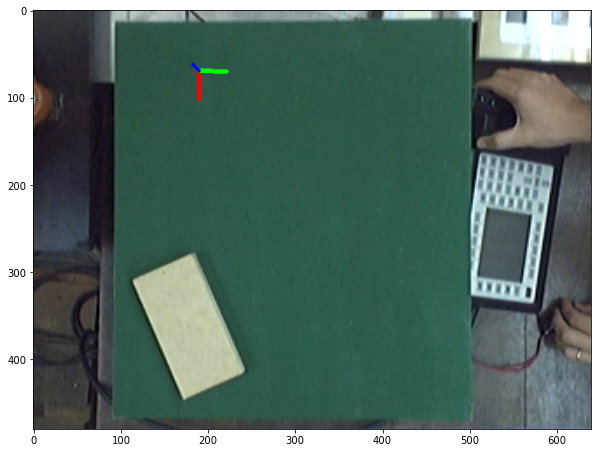

In [49]:
dibujar_eje_cal_extr(3,bloques)

## 4) Validación del algoritmo

Un método de validación posible consistiría en medir con una regla respecto de la terna de trabajo hasta el centro del bloque las coordenadas de x e y. Teniendo esas medidas lo deberíamos comparar con los datos obtenidos en la detección de los bloques.

Para que la validación sea correcta, la terna de trabajo debe ser la que obtuvimos con la calibración extrínseca. 

## 5) Algoritmo de medición de bloques

Para poder obtener las dimensiones de los bloques voy a utilizar los vértices obtenidos en el punto 3.

In [50]:
def imprimir_vertices_pix(vertices):
    for i in range(len(vertices)):
        print('Bloque ',i+1)
        print(vertices[i])

In [51]:
print('Vertices en pixeles')
imprimir_vertices_pix(vertices)

Vertices en pixeles
Bloque  1
[[321.38174  207.73497 ]
 [270.3229   151.51288 ]
 [381.6207    50.436295]
 [432.67953  106.65839 ]]
Bloque  2
[[319.83392 237.0455 ]
 [220.30722 126.03494]
 [276.3382   75.80026]
 [375.8649  186.81082]]
Bloque  3
[[410.82928  235.53656 ]
 [348.2697    99.04303 ]
 [417.6872    67.226685]
 [480.24677  203.72021 ]]
Bloque  4
[[172.33966 446.28552]
 [112.79013 308.5772 ]
 [184.71814 277.4732 ]
 [244.26767 415.18152]]
Bloque  5
[[270.90485 435.0908 ]
 [218.71136 380.4119 ]
 [327.26056 276.79678]
 [379.45404 331.47568]]
Bloque  6
[[413.94568 443.6168 ]
 [337.16107 312.3398 ]
 [402.78546 273.95572]
 [479.57007 405.2327 ]]
Bloque  7
[[399.34485 355.13788]
 [329.      326.99994]
 [384.72412 187.68964]
 [455.06897 215.82758]]
Bloque  8
[[270.04593 349.35437]
 [218.00864 209.2539 ]
 [288.71164 182.9928 ]
 [340.74893 323.09326]]
Bloque  9
[[162.22198 341.6463 ]
 [ 89.1446  315.6476 ]
 [139.06802 175.32233]
 [212.14542 201.32101]]
Bloque  10
[[167.07533  228.96573 ]
 

In [52]:
def pasar_vertices_a_mm(vertices):
    vertices_mm=[]

    for v in vertices:
        vertices_mm.append(pasar_a_mm(v))
    
    return vertices_mm

In [53]:
def imprimir_vertices_mm(vertices):
    for i in range(len(vertices)):
        print('Bloque ',i+1)
        v = vertices_mm[i]
        print('{}\n{}\n{}\n{}\n'.format(v[0],v[1],v[2],v[3]))

In [54]:
print('Vertices en mm')
vertices_mm = pasar_vertices_a_mm(vertices)
imprimir_vertices_mm(vertices_mm)

Vertices en mm
Bloque  1
(114.50777032403914, 118.55057976755954)
(69.9643075379719, 70.19594899552645)
(165.30703802733174, -17.177597077414656)
(209.32371272021322, 31.28173272239724)

Bloque  2
(113.37493754680649, 143.8013672748396)
(26.266389830603003, 48.204962765854226)
(74.61172185280486, 4.602784603348102)
(161.1974730770777, 100.29657611223678)

Bloque  3
(191.3854977761143, 141.9350622424802)
(136.94130625614412, 24.744726931303404)
(196.30444572756775, -2.641394916966015)
(250.25973480285882, 114.33068333608188)

Bloque  4
(-12.817570359085972, 325.6673368310082)
(-66.24989950098553, 207.30786137731724)
(-3.5028309833820037, 179.69010105256487)
(49.42206868252741, 297.806149088413)

Bloque  5
(72.60314808537424, 314.5039333399089)
(26.977929417413232, 268.23694472779283)
(120.03878502417346, 177.93898505166752)
(165.14617316088325, 224.34144773212182)

Bloque  6
(195.19934720151912, 319.5924353472673)
(128.7863003129116, 208.37262847286715)
(184.73810250681294, 174.89632264

In [55]:
def obtener_dimensiones(vertices_mm):
    dimensiones_mm=[]

    for v in vertices_mm:
        h = np.sqrt((v[1][0]-v[0][0])**2+(v[1][1]-v[0][1])**2)
        w = np.sqrt((v[3][0]-v[0][0])**2+(v[3][1]-v[0][1])**2)
    
        if h>w:
            dimensiones_mm.append([h,w])
        else:
            dimensiones_mm.append([w,h])
    
    return dimensiones_mm

In [56]:
def imprimir_dimensiones(dimensiones):
    
    for i in range(len(dimensiones)):
    
        h = dimensiones[i][0]
        w = dimensiones[i][1]
        print('Bloque ',i+1)
        print('Altura: {} - Ancho: {}\n'.format(h,w))

In [57]:
dimensiones_mm = obtener_dimensiones(vertices_mm)

print('Dimensiones en mm\n')
imprimir_dimensiones(dimensiones_mm)

Dimensiones en mm

Bloque  1
Altura: 128.86393831117584 - Ancho: 65.74412820985161

Bloque  2
Altura: 129.33124773337516 - Ancho: 64.65030362377068

Bloque  3
Altura: 129.21975344586153 - Ancho: 65.02443786984476

Bloque  4
Altura: 129.86138466534675 - Ancho: 68.19104377012029

Bloque  5
Altura: 129.2032712476766 - Ancho: 64.97918754288125

Bloque  6
Altura: 129.53971683698884 - Ancho: 64.81080831663509

Bloque  7
Altura: 128.33409018830412 - Ancho: 64.74042815340529

Bloque  8
Altura: 129.0685365306709 - Ancho: 65.04345274539817

Bloque  9
Altura: 129.0601299227628 - Ancho: 67.98847111398523

Bloque  10
Altura: 131.6158166721246 - Ancho: 66.20167042023064

Bloque  11
Altura: 128.66793237633212 - Ancho: 67.59738080248829

Bloque  12
Altura: 130.92218559193714 - Ancho: 65.00460242999544

Bloque  13
Altura: 129.97740504023392 - Ancho: 64.87692347869792

Bloque  14
Altura: 128.8353768327577 - Ancho: 64.64871578914614

Bloque  15
Altura: 128.60752998772537 - Ancho: 64.84186475753386



Podemos ver que los valores son bastante cercanos al dato que tenemos de las medidas reales de los bloques (65mm x 130mm).

Ahora voy a estimar el error que se comete en este pasaje de unidades:

In [58]:
def error_bloques(dimensiones_mm):
    h_real = 130
    w_real = 65

    errores_h = []
    errores_w = []

    for d in dimensiones_mm:
    
        error_h = abs(h_real - d[0])/h_real*100
        error_w = abs(w_real - d[1])/w_real*100
    
        errores_h.append(error_h)
        errores_w.append(error_w)
        
    return errores_h,errores_w

In [59]:
print('Errores en %\n')

errores_h,errores_w = error_bloques(dimensiones_mm)

for i in range(len(dimensiones_mm)):
    
    error_h = errores_h[i]
    error_w = errores_w[i]
    print('Bloque ',i+1)
    print('Error en altura: {} - Error en ancho: {}\n'.format(error_h,error_w))

Errores en %

Bloque  1
Error en altura: 0.8738936067878128 - Error en ancho: 1.144812630540938

Bloque  2
Error en altura: 0.5144248204806428 - Error en ancho: 0.5379944249681811

Bloque  3
Error en altura: 0.6001896570295938 - Error en ancho: 0.03759672283809305

Bloque  4
Error en altura: 0.10662718050250183 - Error en ancho: 4.909298107877366

Bloque  5
Error en altura: 0.6128682710179917 - Error en ancho: 0.032019164798078655

Bloque  6
Error en altura: 0.3540639715470425 - Error en ancho: 0.29106412825370853

Bloque  7
Error en altura: 1.28146908591991 - Error en ancho: 0.3993413024534002

Bloque  8
Error en altura: 0.7165103610223756 - Error en ancho: 0.06685037753564635

Bloque  9
Error en altura: 0.7229769824901557 - Error en ancho: 4.597647867669581

Bloque  10
Error en altura: 1.2429359016343038 - Error en ancho: 1.848723723431756

Bloque  11
Error en altura: 1.0246674028214477 - Error en ancho: 3.9959704653665975

Bloque  12
Error en altura: 0.7093735322593357 - Error en an

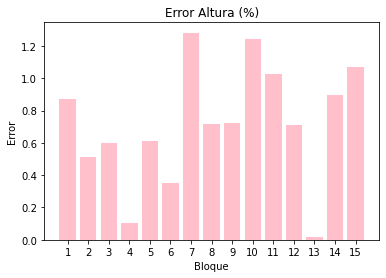

In [60]:
plt.bar(range(15), errores_h, label = 'Error Altura (%)',color='pink')
plt.ylabel("Error")
plt.xlabel("Bloque")
plt.title("Error Altura (%)")
plt.xticks(range(0,15),list(range(1,16)))
plt.show()

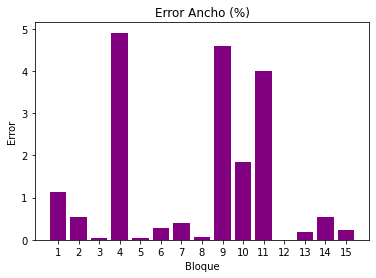

In [61]:
plt.bar(range(15), errores_w, label = 'Error Ancho (%)',color='purple')
plt.ylabel("Error")
plt.xlabel("Bloque")
plt.title("Error Ancho (%)")
plt.xticks(range(0,15),list(range(1,16)))
plt.show()

# Dificultad

Se presentan además los siguientes puntos optativos:

1. Adaptación de los algoritmos para que puedan trabajar con múltiples objetos en el campo de visión (archivo imgBloque20.png)
2. Evaluación de los algoritmos desarrollados contra el set de imágenes presentes en el directorio img_bloques_desafio

## D1)  Múltiples objetos

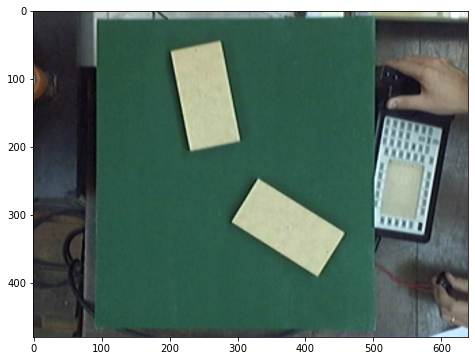

In [62]:
imgbloque20 = glob.glob('./img_bloques/imgBloque20.png')

bloque20 = cv.imread(imgbloque20[0])
bloque20RGB = cv.cvtColor(bloque20, cv.COLOR_BGR2RGB)

plt.figure(figsize=(8,6))
plt.imshow(bloque20RGB)
plt.show()

**Algoritmo de búsqueda de bloques**

La modificación que hice fue iterar primero en los contornos de la imagen buscando que áreas son mayores a 10.000, para poder luego dibujar esos contornos en la misma imagen. 

In [63]:
contours20 = hallar_contornos(bloque20RGB)

In [64]:
bloques20 = []

for cnt in contours20:
    area = cv.contourArea(cnt)
    
    if area > 10000:
        bloques20.append(cnt)


Bloque 1 
 Centro: (374.8202209472656,318.88763427734375)
 Perimetro: 474.5117543935776 
 Área: 181.0 
 Dimension: (75.89583587646484, 150.51968383789062) 
 Orientación: 122.29176330566406

Bloque 2 
 Centro: (253.23565673828125,125.55183410644531)
 Perimetro: 469.0365778207779 
 Área: 181.0 
 Dimension: (75.17633056640625, 150.4873504638672) 
 Orientación: 169.00450134277344


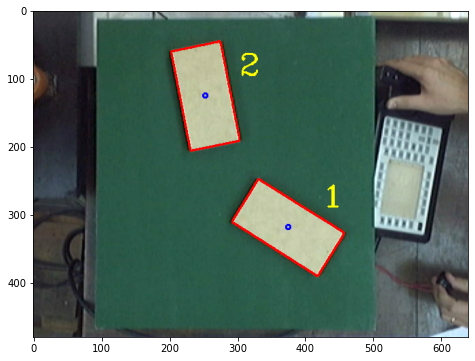

In [65]:
i=1
centros20=[]
vertices20=[]

img_out = bloque20RGB.copy()
    
for cnt in bloques20:
    
    #Dibujo contornos
    cv.drawContours(img_out, [cnt], 0, (255,0,0), 2)
            
    # Centroide
    M = cv.moments(cnt)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    cv.circle(img_out,(cx,cy),3,(0,0,255),2)
            
    # Perimetro
    p = cv.arcLength(cnt,False)
            
    # Orientacion en sentido antihorario
    (x,y),(MA,ma),angulo = cv.fitEllipse(cnt)
            
    #Dimension, vertices y centro
    (centro, dimension, a) = cv.minAreaRect(cnt)
    box = cv.boxPoints((centro, dimension, a))
            
    vertices20.append(box)
    centros20.append(centro)
            
    centrox = centro[0]
    centroy = centro[1]
        
    cv.putText(img_out, str(i), (cx+50, cy-30), cv.FONT_HERSHEY_COMPLEX, 1.5, (255,255,0),2)
            
        
    print('\nBloque {} \n Centro: ({},{})\n Perimetro: {} \n Área: {} \n Dimension: {} \n Orientación: {}'
                 .format(i,centrox,centroy, p, area, dimension, angulo))
        
    i+=1
        
        
plt.figure(figsize=(8,6))
plt.imshow(img_out)
plt.show()

**Algoritmo de medición**

El algoritmo funcionó correctamente sin hacer ningun cambio.

In [66]:
centros_mm20 = pasar_a_mm(centros20)

print('Centros en mm')
imprimir_centros(centros_mm20)

Centros en mm
Bloque 1: (161.10746555487242,213.61472326219356)
Bloque 2: (54.93048880909826,47.74254257204401)


In [67]:
print('Vertices en pixeles')
imprimir_vertices_pix(vertices20)

Vertices en pixeles
Bloque  1
[[418.52808 390.95505]
 [290.88763 311.17978]
 [331.11237 246.82022]
 [458.7528  326.5955 ]]
Bloque  2
[[230.82784  206.62201 ]
 [201.8719    58.946686]
 [275.6435    44.48166 ]
 [304.59943  192.15698 ]]


In [68]:
print('Vertices en mm')
vertices_mm20 = pasar_vertices_a_mm(vertices20)
imprimir_vertices_mm(vertices_mm20)

Vertices en mm
Bloque  1
(114.50777032403914, 118.55057976755954)
(69.9643075379719, 70.19594899552645)
(165.30703802733174, -17.177597077414656)
(209.32371272021322, 31.28173272239724)

Bloque  2
(113.37493754680649, 143.8013672748396)
(26.266389830603003, 48.204962765854226)
(74.61172185280486, 4.602784603348102)
(161.1974730770777, 100.29657611223678)



In [69]:
dimensiones_mm20 = obtener_dimensiones(vertices_mm20)

print('Dimensiones en mm\n')
imprimir_dimensiones(dimensiones_mm20)

Dimensiones en mm

Bloque  1
Altura: 128.60752998772537 - Ancho: 64.84186475753386

Bloque  2
Altura: 130.89832641095697 - Ancho: 65.11106624571305



In [70]:
print('Errores en %\n')

errores_h,errores_w = error_bloques(dimensiones_mm20)

for i in range(len(dimensiones_mm20)):
    
    error_h = errores_h[i]
    error_w = errores_w[i]
    print('Bloque ',i+1)
    print('Error en altura: {} - Error en ancho: {}\n'.format(error_h,error_w))

Errores en %

Bloque  1
Error en altura: 1.0711307786727913 - Error en ancho: 0.24328498840945328

Bloque  2
Error en altura: 0.6910203161207453 - Error en ancho: 0.17087114725084207



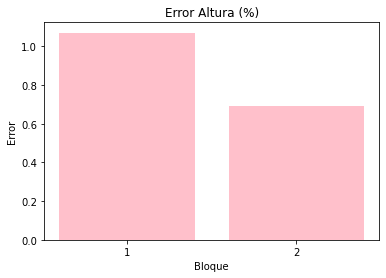

In [71]:
plt.bar(range(2), errores_h, label = 'Error Altura (%)',color='pink')
plt.ylabel("Error")
plt.xlabel("Bloque")
plt.title("Error Altura (%)")
plt.xticks(range(0,2),list(range(1,3)))
plt.show()

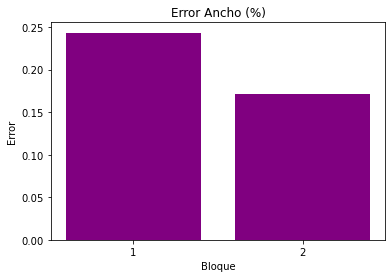

In [72]:
plt.bar(range(2), errores_w, label = 'Error Ancho (%)',color='purple')
plt.ylabel("Error")
plt.xlabel("Bloque")
plt.title("Error Ancho (%)")
plt.xticks(range(0,2),list(range(1,3)))
plt.show()

## D2)  Set de imágenes desafío

**Algoritmo de búsqueda de bloques**

In [73]:
img_bloques_desafio = glob.glob('./img_bloques_desafio/*')
set_desafio = img_bloques_desafio[:3]
patron_desafio = img_bloques_desafio[-1]

print("Set desafio: Hay {} fotos de bloques".format(len(set_desafio)))

Set desafio: Hay 3 fotos de bloques


Bloque 1
 Centro: (322.96759033203125,326.9097900390625)
 Perimetro: 453.357426404953 
 Área: 10075.0 
 Dimension: (146.43658447265625, 72.40951538085938) 
 Orientación: 63.87074279785156


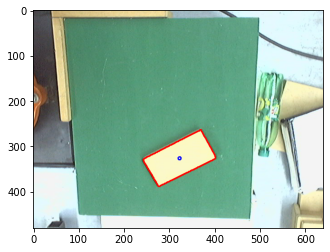

Bloque 2
 Centro: (324.0000305175781,154.5)
 Perimetro: 483.6000670194626 
 Área: 11425.5 
 Dimension: (152.4998321533203, 77.8151626586914) 
 Orientación: 63.71961975097656


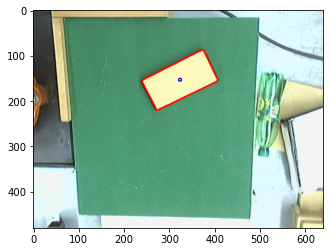

Bloque 3
 Centro: (323.2886962890625,327.0200500488281)
 Perimetro: 456.5289993286133 
 Área: 10140.0 
 Dimension: (146.39996337890625, 73.32141876220703) 
 Orientación: 63.83835220336914


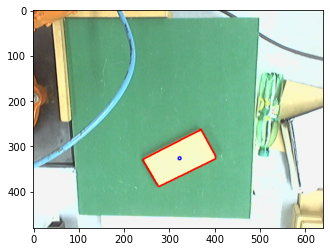

In [74]:
centros_d,vertices_d = buscar_bloques(set_desafio)

Se encontraron correctamente todos los bloques.

**Algoritmo de medición**

Busco las esquinas en la imagen del patrón:

Procesando: ./img_bloques_desafio\imgCalExtr.jpg... Encontramos esquinas!
Buscando esquinas en resolución subpixel... OK!


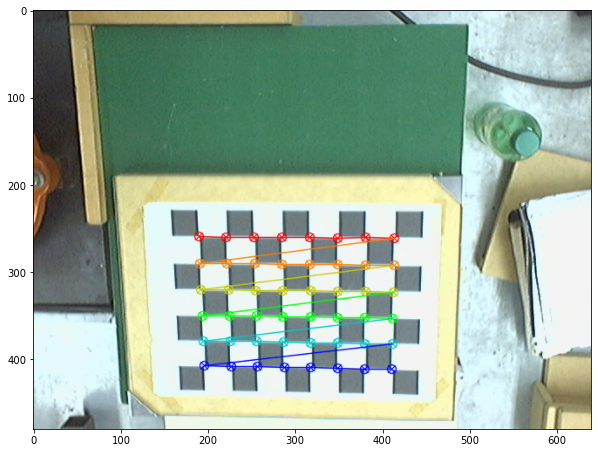


Tiempo de procesamiento 0.6784489154815674 segundos


In [75]:
ver_imgs=True
obj_points_CalExtrD, img_points_CalExtrD = encontrar_esquinas([patron_desafio])

Ahora voy a tener que usar la matriz de la cámara y los coeficientes de distorsión en la función `solvePnP` para encontrar el vector de rotación y el vector de traslación de esta imagen.

In [76]:
print('Matriz de la camara = ')
print(mtx)

print('\nCoeficientes de distorsion = ')
print(dist)

Matriz de la camara = 
[[808.76072566   0.         314.91967927]
 [  0.         808.95652192 240.03546094]
 [  0.           0.           1.        ]]

Coeficientes de distorsion = 
[[ 0.06243353 -0.12168508 -0.0037736  -0.00122221 -0.07015405]]


In [77]:
ret, rvec, tvec = cv.solvePnP(obj_points_CalExtrD[0],img_points_CalExtrD[0],mtx,dist)

In [78]:
print('Vector de rotacion = ')
print(rvec)

Vector de rotacion = 
[[ 0.22502076]
 [ 0.06937913]
 [-0.00196469]]


In [79]:
print('Vector de traslacion = ')
t = tvec
print(t)

Vector de traslacion = 
[[-110.03292445]
 [  16.86509189]
 [ 711.8725877 ]]


In [80]:
R = cv.Rodrigues(rvec)[0]

print('Matriz de rotacion = ')
print(R)

Matriz de rotacion = 
[[ 0.99760245  0.00971645  0.06851968]
 [ 0.00582329  0.97479768 -0.22301473]
 [-0.06895973  0.22287905  0.97240397]]


In [81]:
patron_desafio

'./img_bloques_desafio\\imgCalExtr.jpg'

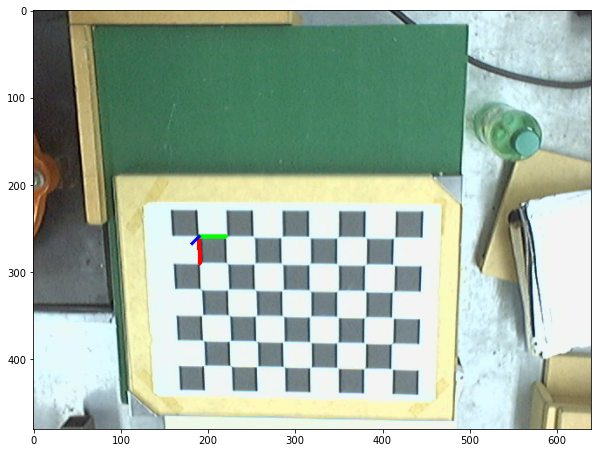

In [82]:
dibujar_eje_cal_extr(0,[patron_desafio])

Ahora hago el pasaje de unidades de pixel a mm

In [83]:
print('Centros en pixeles')
imprimir_centros(centros_d)
print('\n')
centrosmm_d = pasar_a_mm(centros_d)

print('Centros en mm')
imprimir_centros(centrosmm_d)

Centros en pixeles
Bloque 1: (322.96759033203125,326.9097900390625)
Bloque 2: (324.0000305175781,154.5)
Bloque 3: (323.2886962890625,327.0200500488281)


Centros en mm
Bloque 1: (116.85900625191303,61.036598847441276)
Bloque 2: (118.88294808437405,-92.11148696977446)
Bloque 3: (117.14359245017383,61.13547636556606)


In [84]:
print('Vertices en pixeles')
imprimir_vertices_pix(vertices_d)

Vertices en pixeles
Bloque  1
[[274.01752 392.2978 ]
 [241.29097 327.70593]
 [371.91766 261.5218 ]
 [404.64423 326.11365]]
Bloque  2
[[273.2      223.4     ]
 [238.40004  153.79999 ]
 [374.80005   85.600006]
 [409.60004  155.20001 ]]
Bloque  3
[[275.19888 393.2742 ]
 [241.42984 328.1921 ]
 [371.3785  260.7659 ]
 [405.14755 325.848  ]]


In [85]:
print('Vertices en mm')
verticesmm_d = pasar_vertices_a_mm(vertices_d)
imprimir_vertices_mm(verticesmm_d)

Vertices en mm
Bloque  1
(114.50777032403914, 118.55057976755954)
(69.9643075379719, 70.19594899552645)
(165.30703802733174, -17.177597077414656)
(209.32371272021322, 31.28173272239724)

Bloque  2
(113.37493754680649, 143.8013672748396)
(26.266389830603003, 48.204962765854226)
(74.61172185280486, 4.602784603348102)
(161.1974730770777, 100.29657611223678)

Bloque  3
(191.3854977761143, 141.9350622424802)
(136.94130625614412, 24.744726931303404)
(196.30444572756775, -2.641394916966015)
(250.25973480285882, 114.33068333608188)



In [86]:
dimensionesmm_d = obtener_dimensiones(verticesmm_d)

print('Dimensiones en mm\n')
imprimir_dimensiones(dimensionesmm_d)

Dimensiones en mm

Bloque  1
Altura: 133.801360459813 - Ancho: 67.45029651279744

Bloque  2
Altura: 130.41336118794962 - Ancho: 66.70526925712835

Bloque  3
Altura: 133.83517039330277 - Ancho: 68.27970920009263



In [87]:
print('Errores en %\n')

errores_h,errores_w = error_bloques(dimensionesmm_d)

for i in range(len(dimensionesmm_d)):
    
    error_h = errores_h[i]
    error_w = errores_w[i]
    print('Bloque ',i+1)
    print('Error en altura: {} - Error en ancho: {}\n'.format(error_h,error_w))

Errores en %

Bloque  1
Error en altura: 2.9241234306253827 - Error en ancho: 3.7696869427652864

Bloque  2
Error en altura: 0.3179701445766297 - Error en ancho: 2.6234911648128465

Bloque  3
Error en altura: 2.9501310717713656 - Error en ancho: 5.045706461680963



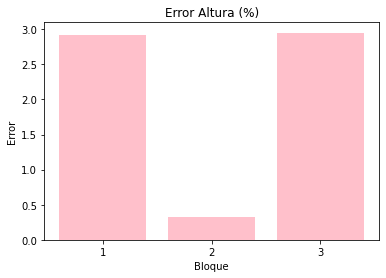

In [88]:
plt.bar(range(3), errores_h, label = 'Error Altura (%)',color='pink')
plt.ylabel("Error")
plt.xlabel("Bloque")
plt.title("Error Altura (%)")
plt.xticks(range(0,3),list(range(1,4)))
plt.show()

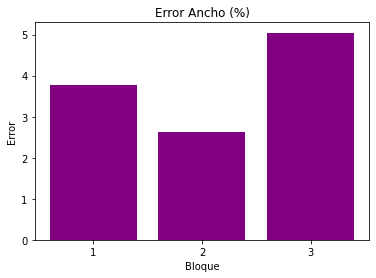

In [89]:
plt.bar(range(3), errores_w, label = 'Error Ancho (%)',color='purple')
plt.ylabel("Error")
plt.xlabel("Bloque")
plt.title("Error Ancho (%)")
plt.xticks(range(0,3),list(range(1,4)))
plt.show()